In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings("ignore")
from scipy.stats             import ttest_1samp,ttest_ind, wilcoxon, shapiro, levene
from statsmodels.stats.power import ttest_power
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [2]:
pd.options.display.max_rows = 999
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [3]:
#from google.colab import files
#import io

#try:
    #uploaded
#except NameError:
    #uploaded = files.upload()

In [4]:
df = pd.read_excel('innercity.xlsx')
df.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940,20150427T000000,600000,4.0,1.75,3050.0,9440.0,1,0,0.0,3,8.0,1800.0,1250.0,1966,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490
1,3145600250,20150317T000000,190000,2.0,1.00,670.0,3101.0,1,0,0.0,4,6.0,670.0,0.0,1948,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771
2,7129303070,20140820T000000,735000,4.0,2.75,3040.0,2415.0,2,1,4.0,3,8.0,3040.0,0.0,1966,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455
3,7338220280,20141010T000000,257000,3.0,2.50,1740.0,3721.0,2,0,0.0,3,8.0,1740.0,0.0,2009,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461
4,7950300670,20150218T000000,450000,2.0,1.00,1120.0,4590.0,1,0,0.0,3,7.0,1120.0,0.0,1924,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710


In [5]:
from datetime import datetime

In [6]:
date_format = '%Y%m%dT%H%M%S'

In [7]:
df['dayhours'] = df['dayhours'].apply(lambda x: datetime.strptime(x, date_format)) #dataset converted to date time format

In [8]:
df.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940,2015-04-27,600000,4.0,1.75,3050.0,9440.0,1,0,0.0,3,8.0,1800.0,1250.0,1966,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490
1,3145600250,2015-03-17,190000,2.0,1.00,670.0,3101.0,1,0,0.0,4,6.0,670.0,0.0,1948,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771
2,7129303070,2014-08-20,735000,4.0,2.75,3040.0,2415.0,2,1,4.0,3,8.0,3040.0,0.0,1966,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455
3,7338220280,2014-10-10,257000,3.0,2.50,1740.0,3721.0,2,0,0.0,3,8.0,1740.0,0.0,2009,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461
4,7950300670,2015-02-18,450000,2.0,1.00,1120.0,4590.0,1,0,0.0,3,7.0,1120.0,0.0,1924,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   cid               21613 non-null  int64         
 1   dayhours          21613 non-null  datetime64[ns]
 2   price             21613 non-null  int64         
 3   room_bed          21505 non-null  float64       
 4   room_bath         21505 non-null  float64       
 5   living_measure    21596 non-null  float64       
 6   lot_measure       21571 non-null  float64       
 7   ceil              21571 non-null  object        
 8   coast             21612 non-null  object        
 9   sight             21556 non-null  float64       
 10  condition         21556 non-null  object        
 11  quality           21612 non-null  float64       
 12  ceil_measure      21612 non-null  float64       
 13  basement          21612 non-null  float64       
 14  yr_built          2161

In [10]:
for column in df.columns:
    # Get the descriptive statistics for the column
    stats = df[column].describe()
    # Print the column name and its descriptive statistics
    print(f"Column: {column}")
    print(stats)
    print()

Column: cid
count    2.161300e+04
mean     4.580302e+09
std      2.876566e+09
min      1.000102e+06
25%      2.123049e+09
50%      3.904930e+09
75%      7.308900e+09
max      9.900000e+09
Name: cid, dtype: float64

Column: dayhours
count                   21613
unique                    372
top       2014-06-23 00:00:00
freq                      142
first     2014-05-02 00:00:00
last      2015-05-27 00:00:00
Name: dayhours, dtype: object

Column: price
count    2.161300e+04
mean     5.401822e+05
std      3.673622e+05
min      7.500000e+04
25%      3.219500e+05
50%      4.500000e+05
75%      6.450000e+05
max      7.700000e+06
Name: price, dtype: float64

Column: room_bed
count    21505.000000
mean         3.371355
std          0.930289
min          0.000000
25%          3.000000
50%          3.000000
75%          4.000000
max         33.000000
Name: room_bed, dtype: float64

Column: room_bath
count    21505.000000
mean         2.115171
std          0.770248
min          0.000000
25%    

In [11]:
def find_special_characters(dataframe, special_char):
    special_chars_found = []

    for column in dataframe.columns:
        contains_special_char = dataframe[column].astype(str).str.contains(special_char).any()
        if contains_special_char:
            special_chars_found.append(column)

    return special_chars_found

In [12]:
special_chars = find_special_characters(df, '$')
print(special_chars)

['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished', 'total_area']


**all the columns containing $ specail characters, we can replace it with null value**

In [13]:
df = df.replace('$', np.nan)

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   cid               21613 non-null  int64         
 1   dayhours          21613 non-null  datetime64[ns]
 2   price             21613 non-null  int64         
 3   room_bed          21505 non-null  float64       
 4   room_bath         21505 non-null  float64       
 5   living_measure    21596 non-null  float64       
 6   lot_measure       21571 non-null  float64       
 7   ceil              21541 non-null  float64       
 8   coast             21582 non-null  float64       
 9   sight             21556 non-null  float64       
 10  condition         21528 non-null  float64       
 11  quality           21612 non-null  float64       
 12  ceil_measure      21612 non-null  float64       
 13  basement          21612 non-null  float64       
 14  yr_built          2159

In [15]:
df.describe(include = 'all').T

,count,unique,top,freq,first,last,mean,std,min,25%,50%,75%,max
cid,21613.0,NaN,NaT,NaN,NaT,NaT,4580301520.864988,2876565571.312048,1000102.0,2123049194.0,3904930410.0,7308900445.0,9900000190.0
dayhours,21613,372,2014-06-23,142,2014-05-02,2015-05-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN
price,21613.0,NaN,NaT,NaN,NaT,NaT,540182.158793,367362.231718,75000.0,321950.0,450000.0,645000.0,7700000.0
room_bed,21505.0,NaN,NaT,NaN,NaT,NaT,3.371355,0.930289,0.0,3.0,3.0,4.0,33.0
room_bath,21505.0,NaN,NaT,NaN,NaT,NaT,2.115171,0.770248,0.0,1.75,2.25,2.5,8.0
living_measure,21596.0,NaN,NaT,NaN,NaT,NaT,2079.860761,918.496121,290.0,1429.25,1910.0,2550.0,13540.0
lot_measure,21571.0,NaN,NaT,NaN,NaT,NaT,15104.583283,41423.619385,520.0,5040.0,7618.0,10684.5,1651359.0
ceil,21541.0,NaN,NaT,NaN,NaT,NaT,1.494127,0.539912,1.0,1.0,1.5,2.0,3.5
coast,21582.0,NaN,NaT,NaN,NaT,NaT,0.00746,0.08605,0.0,0.0,0.0,0.0,1.0
sight,21556.0,NaN,NaT,NaN,NaT,NaT,0.234366,0.766438,0.0,0.0,0.0,0.0,4.0


In [16]:
df.isnull().sum()

cid                   0
dayhours              0
price                 0
room_bed            108
room_bath           108
living_measure       17
lot_measure          42
ceil                 72
coast                31
sight                57
condition            85
quality               1
ceil_measure          1
basement              1
yr_built             15
yr_renovated          0
zipcode               0
lat                   0
long                 34
living_measure15    166
lot_measure15        29
furnished            29
total_area           68
dtype: int64

In [17]:
null_percentage = df.isnull().mean() * 100
print(null_percentage)

cid                 0.000000
dayhours            0.000000
price               0.000000
room_bed            0.499699
room_bath           0.499699
living_measure      0.078656
lot_measure         0.194327
ceil                0.333133
coast               0.143432
sight               0.263730
condition           0.393282
quality             0.004627
ceil_measure        0.004627
basement            0.004627
yr_built            0.069403
yr_renovated        0.000000
zipcode             0.000000
lat                 0.000000
long                0.157313
living_measure15    0.768056
lot_measure15       0.134179
furnished           0.134179
total_area          0.314625
dtype: float64


**Univariate analysis (distribution and spread for every continuous attribute, distribution of data in categories for categorical ones)**

<AxesSubplot:xlabel='total_area', ylabel='Count'>

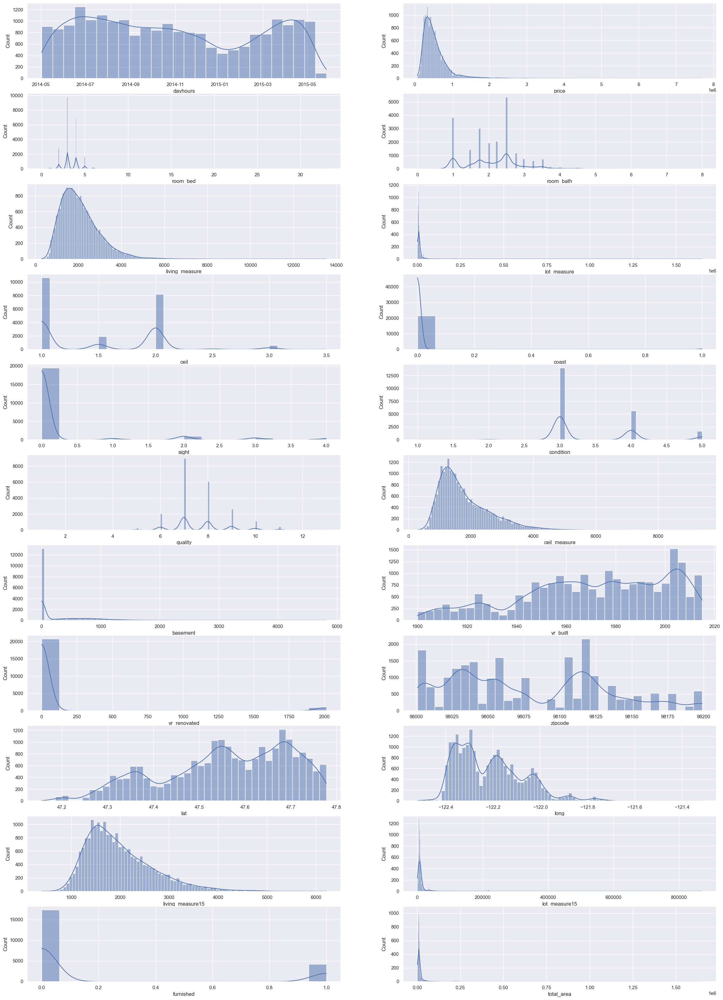

In [18]:
fig, axes = plt.subplots(nrows=11,ncols=2)
fig.tight_layout()
fig.set_size_inches(28,40)
sns.histplot(df['dayhours'], kde=True, ax=axes[0][0])
sns.histplot(df['price'], kde=True, ax=axes[0][1])
sns.histplot(df['room_bed'], kde=True, ax=axes[1][0])
sns.histplot(df['room_bath'], kde=True, ax=axes[1][1])
sns.histplot(df['living_measure'], kde=True, ax=axes[2][0])
sns.histplot(df['lot_measure'], kde=True, ax=axes[2][1])
sns.histplot(df['ceil'], kde=True, ax=axes[3][0])
sns.histplot(df['coast'], kde=True, ax=axes[3][1])
sns.histplot(df['sight'], kde=True, ax=axes[4][0])
sns.histplot(df['condition'], kde=True, ax=axes[4][1])
sns.histplot(df['quality'], kde=True, ax=axes[5][0])
sns.histplot(df['ceil_measure'], kde=True, ax=axes[5][1])
sns.histplot(df['basement'], kde=True, ax=axes[6][0])
sns.histplot(df['yr_built'], kde=True, ax=axes[6][1])
sns.histplot(df['yr_renovated'], kde=True, ax=axes[7][0])
sns.histplot(df['zipcode'], kde=True, ax=axes[7][1])
sns.histplot(df['lat'], kde=True, ax=axes[8][0])
sns.histplot(df['long'], kde=True, ax=axes[8][1])
sns.histplot(df['living_measure15'], kde=True, ax=axes[9][0])
sns.histplot(df['lot_measure15'], kde=True, ax=axes[9][1])
sns.histplot(df['furnished'], kde=True, ax=axes[10][0])
sns.histplot(df['total_area'], kde=True, ax=axes[10][1])

In [19]:
num = df.select_dtypes(['float64','int64'])
cat = df.select_dtypes(['object'])

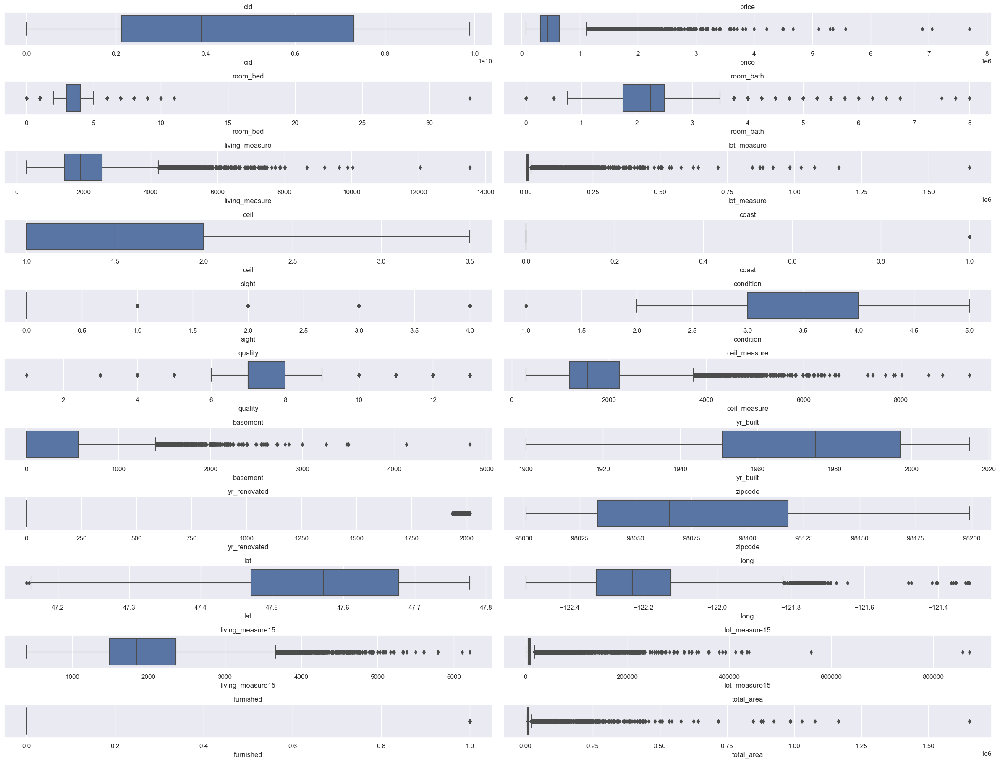

In [20]:
df_col = num.columns
a = len(df_col)
b = 2
c = 1 
fig = plt.figure(figsize=(24,36))
for i in df_col:
    plt.subplot(a, b, c)
    plt.title('{}'.format(i))
    plt.xlabel(i)
    sns.boxplot(num[i])
    c = c + 1
plt.tight_layout()
plt.show()

In [21]:
df.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940,2015-04-27,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0
1,3145600250,2015-03-17,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0
2,7129303070,2014-08-20,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,1966.0,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0
3,7338220280,2014-10-10,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0
4,7950300670,2015-02-18,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0


In [22]:
df.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940,2015-04-27,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0
1,3145600250,2015-03-17,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0
2,7129303070,2014-08-20,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,1966.0,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0
3,7338220280,2014-10-10,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0
4,7950300670,2015-02-18,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   cid               21613 non-null  int64         
 1   dayhours          21613 non-null  datetime64[ns]
 2   price             21613 non-null  int64         
 3   room_bed          21505 non-null  float64       
 4   room_bath         21505 non-null  float64       
 5   living_measure    21596 non-null  float64       
 6   lot_measure       21571 non-null  float64       
 7   ceil              21541 non-null  float64       
 8   coast             21582 non-null  float64       
 9   sight             21556 non-null  float64       
 10  condition         21528 non-null  float64       
 11  quality           21612 non-null  float64       
 12  ceil_measure      21612 non-null  float64       
 13  basement          21612 non-null  float64       
 14  yr_built          2159

In [24]:
df['condition'].value_counts()

3.0    13978
4.0     5655
5.0     1694
2.0      171
1.0       30
Name: condition, dtype: int64

In [25]:
df['quality'].value_counts()

7.0     8981
8.0     6067
9.0     2615
6.0     2038
10.0    1134
11.0     399
5.0      242
12.0      90
4.0       29
13.0      13
3.0        3
1.0        1
Name: quality, dtype: int64

**we can convert coast, sight, yr_built, yr_renoavated, zipcode, furnished to object datatype**

In [26]:
df['coast'] = df['coast'].astype('str')

In [27]:
df['sight'] = df['sight'].astype('str')
df['yr_built'] = df['yr_built'].astype('str')
df['yr_renovated'] = df['yr_renovated'].astype('str')
df['zipcode'] = df['zipcode'].astype('str')
df['furnished'] = df['furnished'].astype('str')

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   cid               21613 non-null  int64         
 1   dayhours          21613 non-null  datetime64[ns]
 2   price             21613 non-null  int64         
 3   room_bed          21505 non-null  float64       
 4   room_bath         21505 non-null  float64       
 5   living_measure    21596 non-null  float64       
 6   lot_measure       21571 non-null  float64       
 7   ceil              21541 non-null  float64       
 8   coast             21613 non-null  object        
 9   sight             21613 non-null  object        
 10  condition         21528 non-null  float64       
 11  quality           21612 non-null  float64       
 12  ceil_measure      21612 non-null  float64       
 13  basement          21612 non-null  float64       
 14  yr_built          2161

**Bivariate/Multivariate  analysis (relationship between different variables, correlations, conditional analysis)**

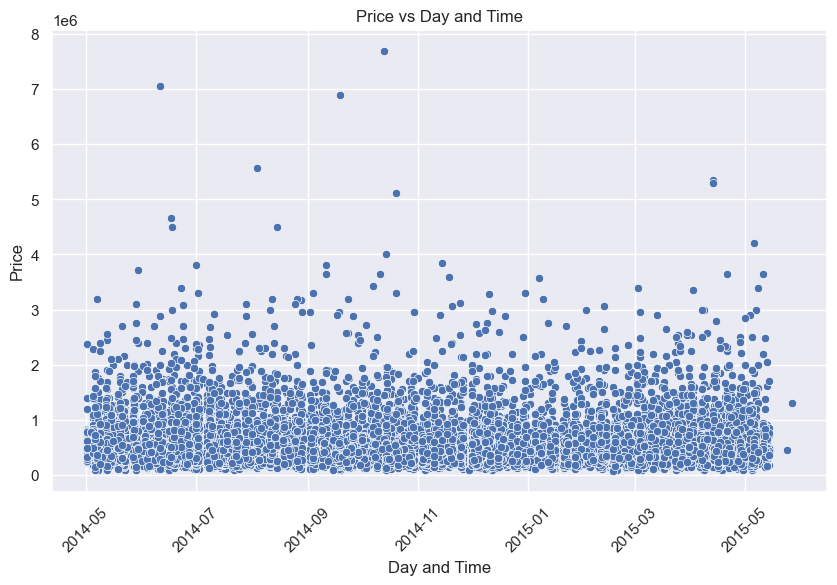

In [29]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='dayhours', y='price', data=df)

# Set the labels and title
plt.xlabel('Day and Time')
plt.ylabel('Price')
plt.title('Price vs Day and Time')

# Rotate x-axis labels for better visibility (optional)
plt.xticks(rotation=45)

# Show the plot
plt.show()

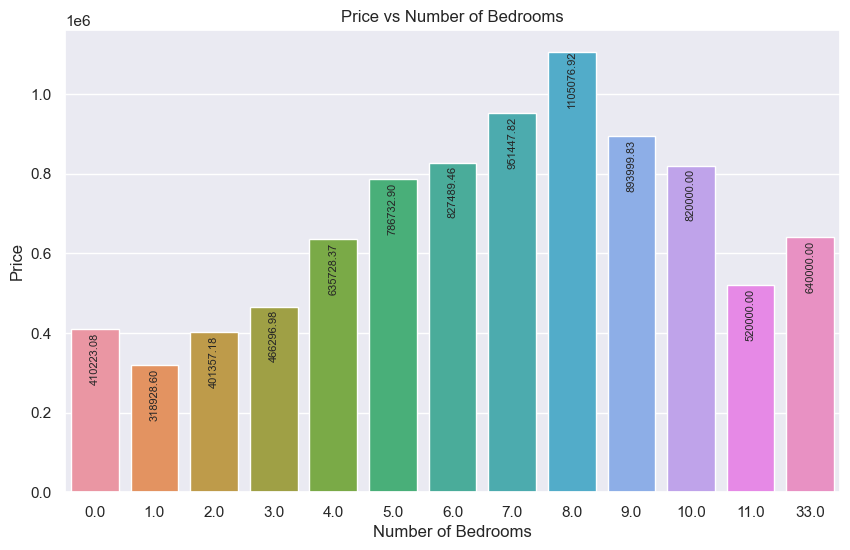

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(x='room_bed', y='price', data=df, ci=None)

# Retrieve the current axes object
ax = plt.gca()

# Add value annotations on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='bottom', xytext=(0, -40), textcoords='offset points', rotation=90, fontsize=8)

# Set the labels and title
plt.xlabel('Number of Bedrooms')
plt.ylabel('Price')
plt.title('Price vs Number of Bedrooms')

# Show the plot
plt.show()


**number of bedroom is showing is zero, need to check, the number of rows**

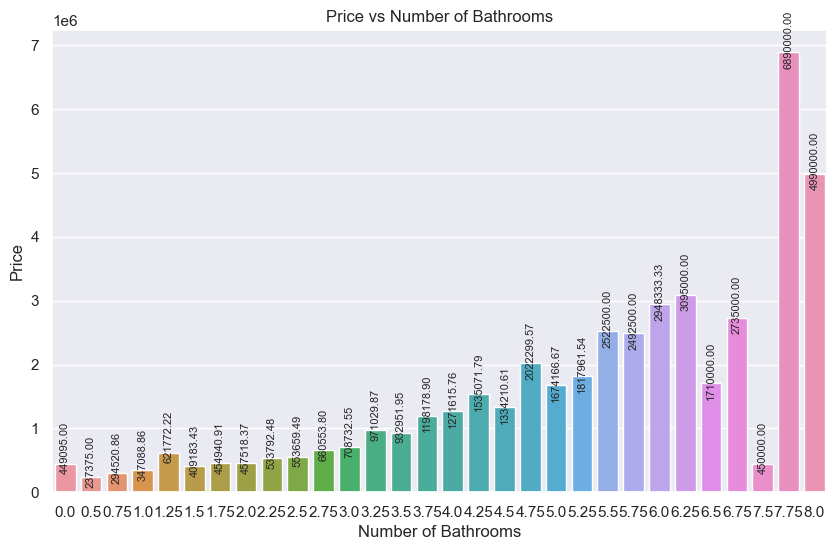

In [31]:
plt.figure(figsize=(10, 6))
sns.barplot(x='room_bath', y='price', data=df,ci=None)

# Retrieve the current axes object
ax = plt.gca()

# Add value annotations on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='top', xytext=(0, 30), textcoords='offset points', rotation=90, fontsize=8)

# Set the labels and title
plt.xlabel('Number of Bathrooms')
plt.ylabel('Price')
plt.title('Price vs Number of Bathrooms')

# Show the plot
plt.show()

**number of bathroom is showing need to check the number of rows**

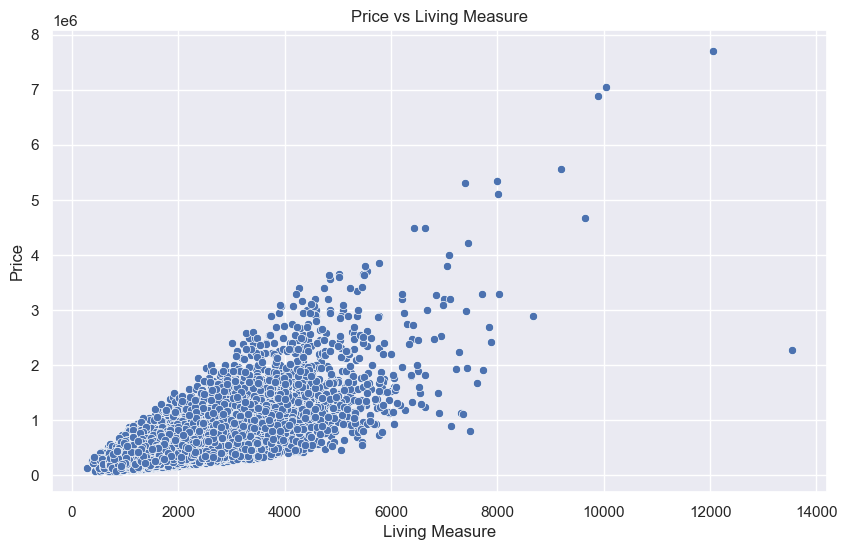

In [32]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='living_measure', y='price', data=df)

# Set the labels and title
plt.xlabel('Living Measure')
plt.ylabel('Price')
plt.title('Price vs Living Measure')

# Show the plot
plt.show()

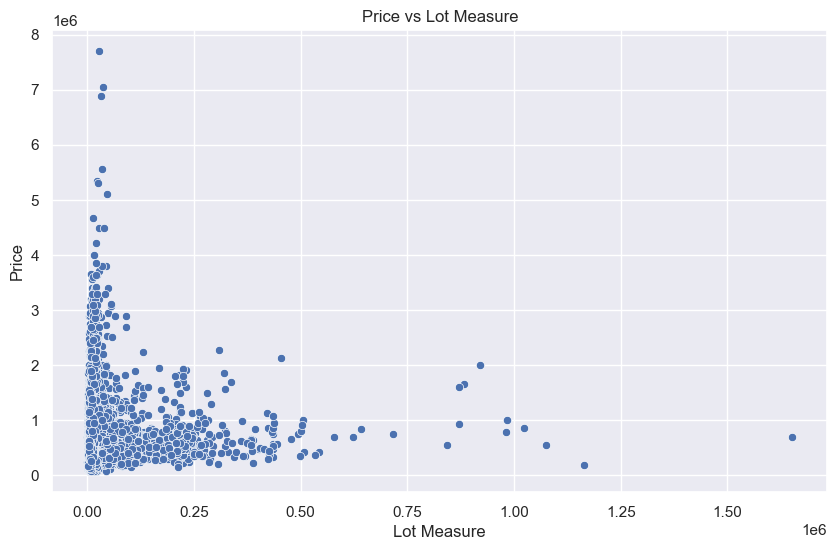

In [33]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='lot_measure', y='price', data=df)

# Set the labels and title
plt.xlabel('Lot Measure')
plt.ylabel('Price')
plt.title('Price vs Lot Measure')

# Show the plot
plt.show()

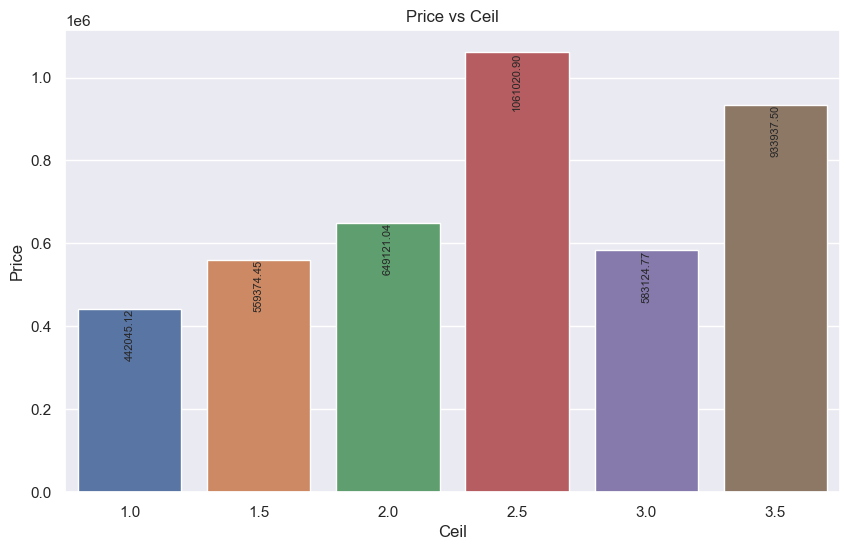

In [34]:
plt.figure(figsize=(10, 6))
sns.barplot(x='ceil', y='price', data=df, ci = None)

# Retrieve the current axes object
ax = plt.gca()

# Add value annotations on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='top', xytext=(0, 0), textcoords='offset points', rotation=90, fontsize = 8)

# Set the labels and title
plt.xlabel('Ceil')
plt.ylabel('Price')
plt.title('Price vs Ceil')

# Show the plot
plt.show()

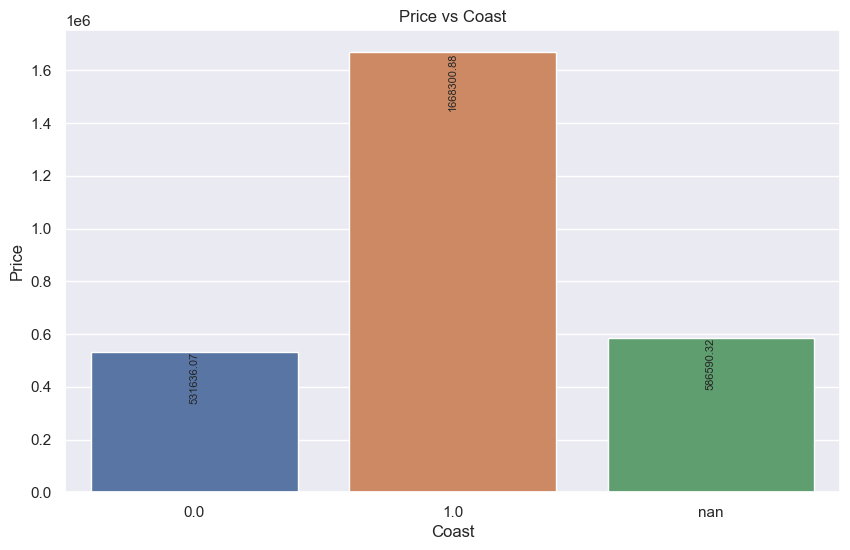

In [35]:
plt.figure(figsize=(10, 6))
sns.barplot(x='coast', y='price', data=df, ci=None)

# Retrieve the current axes object
ax = plt.gca()

# Add value annotations on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='top', xytext=(0, 0), textcoords='offset points', rotation=90, fontsize=8)

# Set the labels and title
plt.xlabel('Coast')
plt.ylabel('Price')
plt.title('Price vs Coast')

# Show the plot
plt.show()

**There is lot of null values are present need to check whether we should drop it or fill with mode**

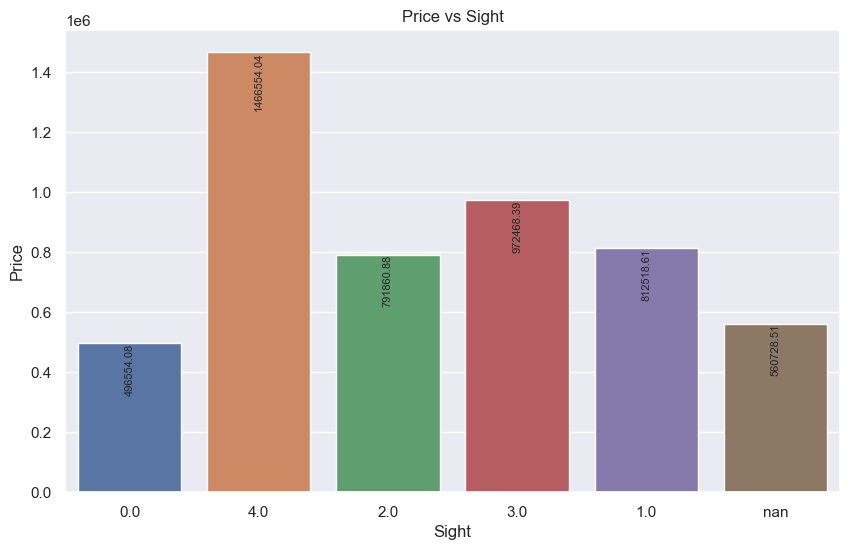

In [36]:
plt.figure(figsize=(10, 6))
sns.barplot(x='sight', y='price', data=df, ci=None)

# Retrieve the current axes object
ax = plt.gca()

# Add value annotations on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='top', xytext=(0, 0), textcoords='offset points', rotation=90, fontsize = 8)

# Set the labels and title
plt.xlabel('Sight')
plt.ylabel('Price')
plt.title('Price vs Sight')

# Show the plot
plt.show()

**There is lot of null values are present need to check whether we should drop it or fill with mode**

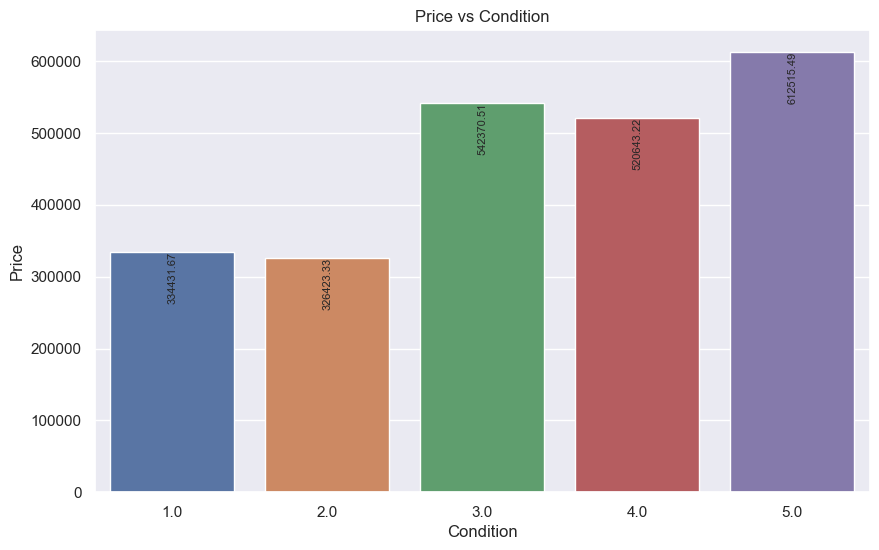

In [37]:
plt.figure(figsize=(10, 6))
sns.barplot(x='condition', y='price', data=df, ci=None)

# Retrieve the current axes object
ax = plt.gca()

# Add value annotations on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='top', xytext=(0, 0), textcoords='offset points', rotation=90, fontsize = 8)

# Set the labels and title
plt.xlabel('Condition')
plt.ylabel('Price')
plt.title('Price vs Condition')

# Show the plot
plt.show()

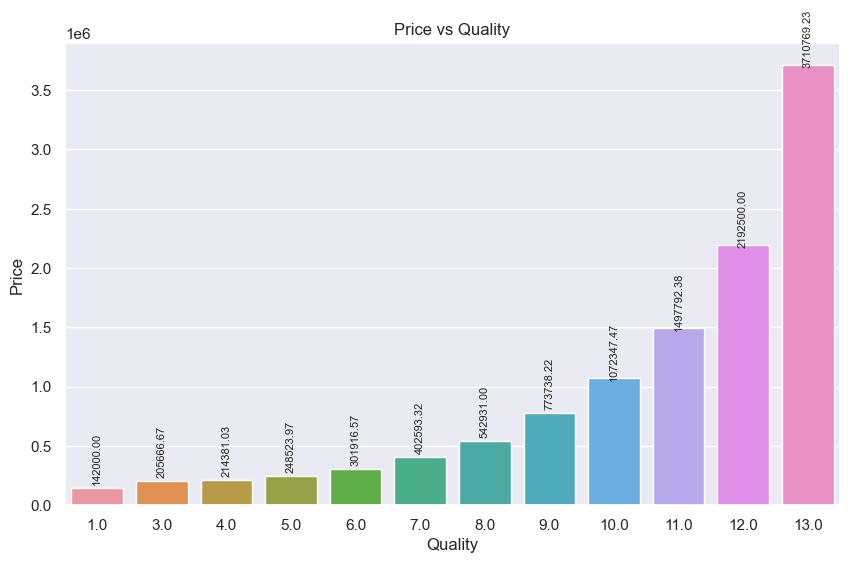

In [38]:
plt.figure(figsize=(10, 6))
sns.barplot(x='quality', y='price', data=df, ci=None)

# Retrieve the current axes object
ax = plt.gca()

# Add value annotations on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='top', xytext=(0, 40), textcoords='offset points', rotation=90, fontsize = 8)

# Set the labels and title
plt.xlabel('Quality')
plt.ylabel('Price')
plt.title('Price vs Quality')

# Show the plot
plt.show()

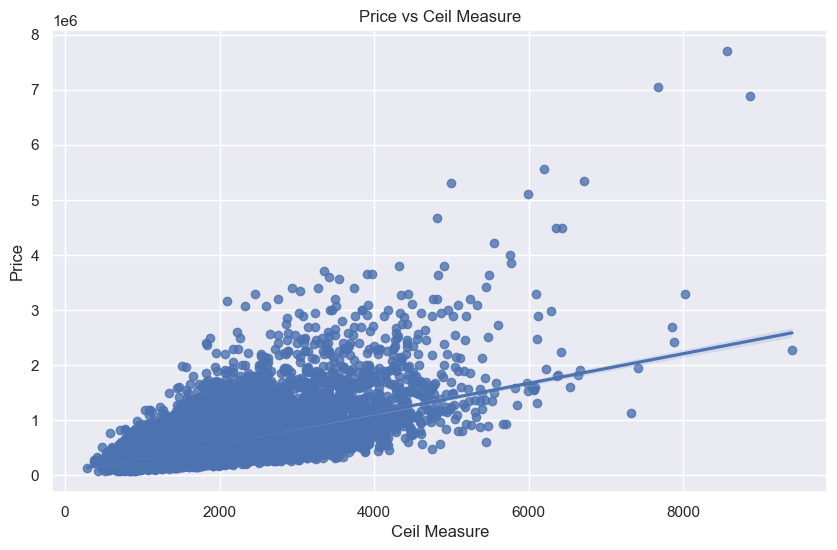

In [39]:
plt.figure(figsize=(10, 6))
sns.regplot(x='ceil_measure', y='price', data=df)

# Set the labels and title
plt.xlabel('Ceil Measure')
plt.ylabel('Price')
plt.title('Price vs Ceil Measure')

# Show the plot
plt.show()

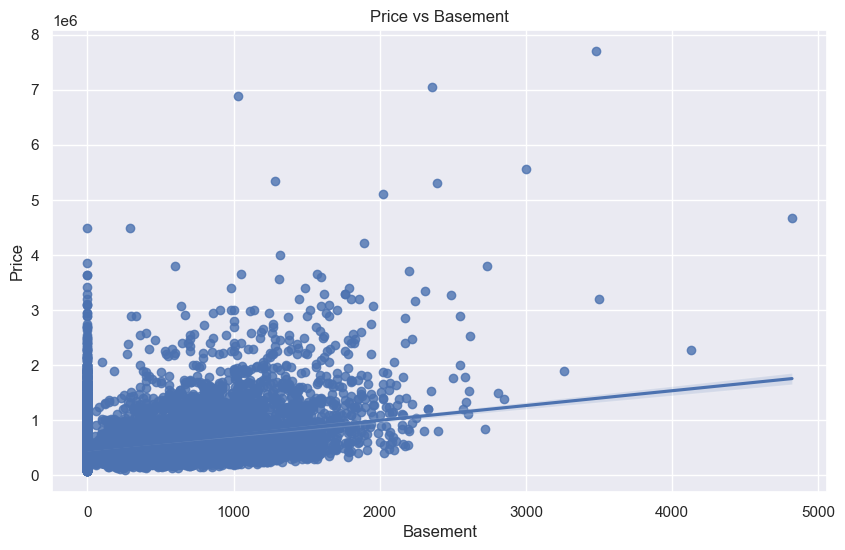

In [40]:
plt.figure(figsize=(10, 6))
sns.regplot(x='basement', y='price', data=df)

# Set the labels and title
plt.xlabel('Basement')
plt.ylabel('Price')
plt.title('Price vs Basement')

# Show the plot
plt.show()

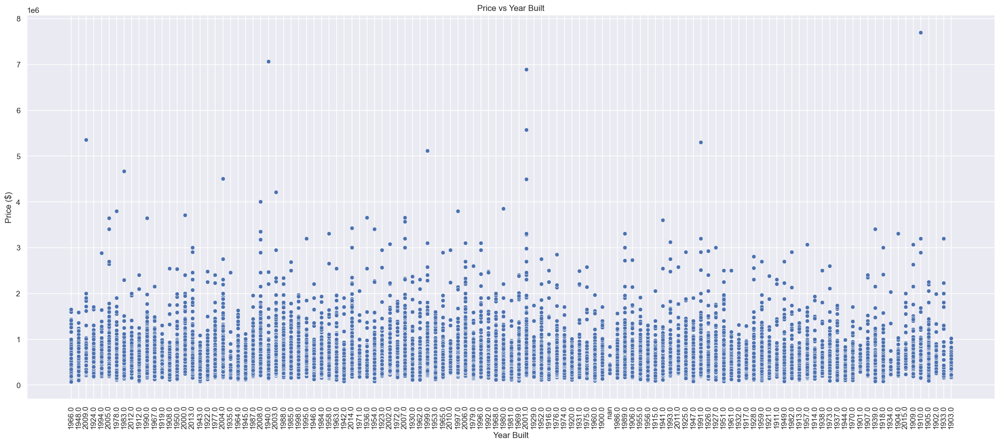

In [41]:
plt.figure(figsize=(25, 10))
sns.scatterplot(x='yr_built', y='price', data=df)
plt.xticks(rotation=90)
# Set the labels and title
plt.xlabel('Year Built')
plt.ylabel('Price ($)')
plt.title('Price vs Year Built')

# Show the plot
plt.show()

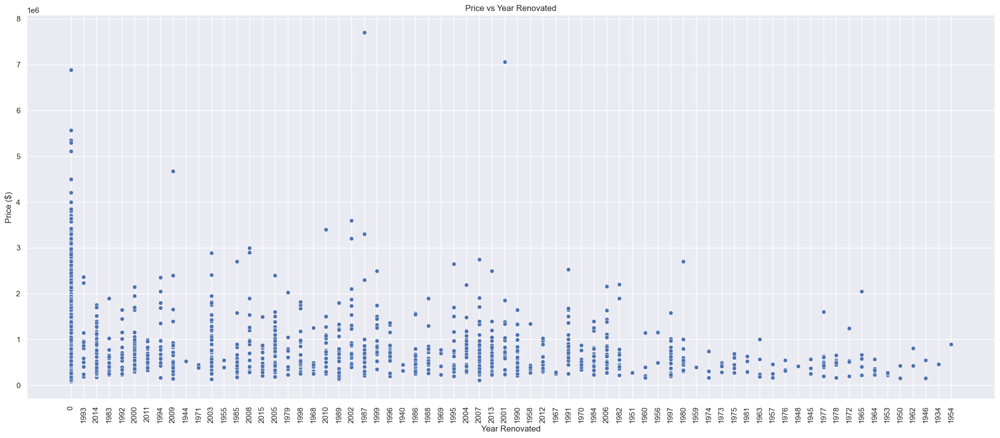

In [42]:
plt.figure(figsize=(25,10))
sns.scatterplot(x='yr_renovated', y='price', data=df)
plt.xticks(rotation=90)
# Set the labels and title
plt.xlabel('Year Renovated')
plt.ylabel('Price ($)')
plt.title('Price vs Year Renovated')

# Show the plot
plt.show()

**we can find the corresponding location with zipcode**

In [43]:
zip_location_map = {
    '98001': 'Auburn',
    '98002': 'Auburn',
    '98003': 'Federal Way',
    '98004': 'Bellevue',
    '98005': 'Bellevue',
    '98006': 'Bellevue',
    '98007': 'Bellevue',
    '98008': 'Bellevue',
    '98009': 'Bellevue',
    '98010': 'Black Diamond',
    '98011': 'Bothell',
    '98014': 'Carnation',
    '98019': 'Duvall',
    '98022': 'Enumclaw',
    '98023': 'Federal Way',
    '98024': 'Fall City',
    '98027': 'Issaquah',
    '98028': 'Kenmore',
    '98029': 'Issaquah',
    '98030': 'Kent',
    '98031': 'Kent',
    '98032': 'Kent',
    '98033': 'Kirkland',
    '98034': 'Kirkland',
    '98038': 'Maple Valley',
    '98039': 'Medina',
    '98040': 'Mercer Island',
    '98042': 'Covington',
    '98045': 'North Bend',
    '98052': 'Redmond',
    '98053': 'Redmond Ridge',
    '98055': 'Renton',
    '98056': 'Renton',
    '98058': 'Renton',
    '98059': 'Renton',
    '98065': 'Snoqualmie',
    '98070': 'Vashon',
    '98072': 'Woodinville',
    '98074': 'Sammamish',
    '98075': 'Sammamish',
    '98077': 'Cottage Lake',
    '98092': 'Auburn',
    '98102': 'Seattle',
    '98103': 'Seattle',
    '98105': 'Seattle',
    '98106': 'Seattle',
    '98107': 'Seattle',
    '98108': 'Seattle',
    '98109': 'Seattle',
    '98112': 'Seattle',
    '98115': 'Seattle',
    '98116': 'Seattle',
    '98117': 'Seattle',
    '98118': 'Seattle',
    '98119': 'Seattle',
    '98122': 'Seattle',
    '98125': 'Seattle',
    '98126': 'Seattle',
    '98133': 'Seattle',
    '98136': 'Seattle',
    '98144': 'Seattle',
    '98146': 'Seattle',
    '98148': 'Burien',
    '98155': 'Shoreline',
    '98166': 'Burien',
    '98168': 'Seattle',
    '98177': 'Seattle',
    '98178': 'Seattle',
    '98188': 'SeaTac',
    '98198': 'Des Moines',
    '98199': 'Seattle'
}

df['location'] = np.where(df['zipcode'].isin(zip_location_map.keys()),
                           df['zipcode'].map(zip_location_map),
                           df['zipcode'])



In [44]:
df.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,location
0,3876100940,2015-04-27,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0,Kirkland
1,3145600250,2015-03-17,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0,Seattle
2,7129303070,2014-08-20,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,1966.0,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0,Seattle
3,7338220280,2014-10-10,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0,Auburn
4,7950300670,2015-02-18,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0,Seattle


In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   cid               21613 non-null  int64         
 1   dayhours          21613 non-null  datetime64[ns]
 2   price             21613 non-null  int64         
 3   room_bed          21505 non-null  float64       
 4   room_bath         21505 non-null  float64       
 5   living_measure    21596 non-null  float64       
 6   lot_measure       21571 non-null  float64       
 7   ceil              21541 non-null  float64       
 8   coast             21613 non-null  object        
 9   sight             21613 non-null  object        
 10  condition         21528 non-null  float64       
 11  quality           21612 non-null  float64       
 12  ceil_measure      21612 non-null  float64       
 13  basement          21612 non-null  float64       
 14  yr_built          2161

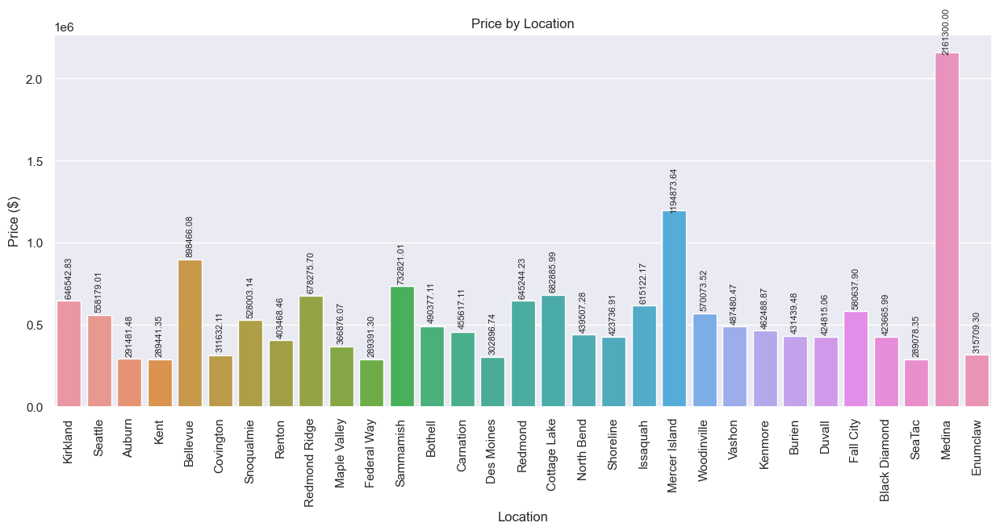

In [46]:
plt.figure(figsize=(15, 6))
sns.barplot(x='location', y='price', data=df, ci=None)

# Retrieve the current axes object
ax = plt.gca()

# Add value annotations on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='top', xytext=(0, 40), textcoords='offset points', rotation=90, fontsize=8)

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Set the labels and title
plt.xlabel('Location')
plt.ylabel('Price ($)')
plt.title('Price by Location')

# Show the plot
plt.show()

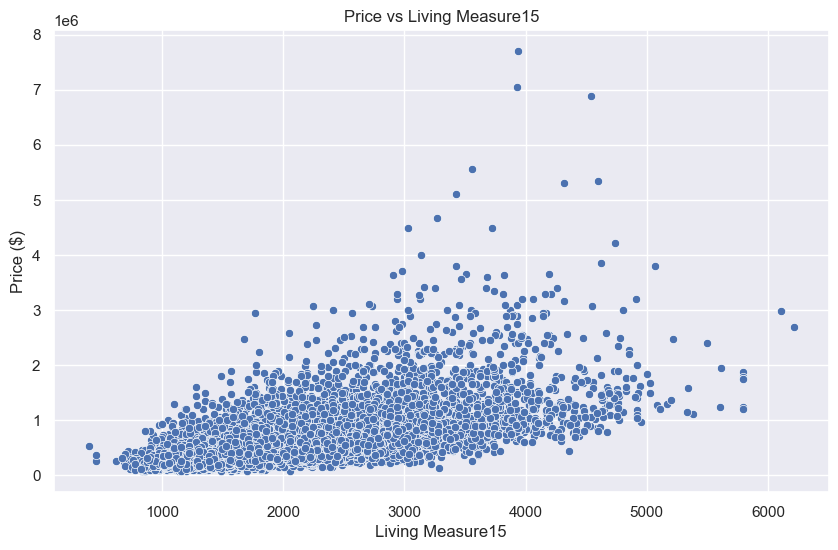

In [47]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='living_measure15', y='price', data=df)

# Set the labels and title
plt.xlabel('Living Measure15')
plt.ylabel('Price ($)')
plt.title('Price vs Living Measure15')

# Show the plot
plt.show()

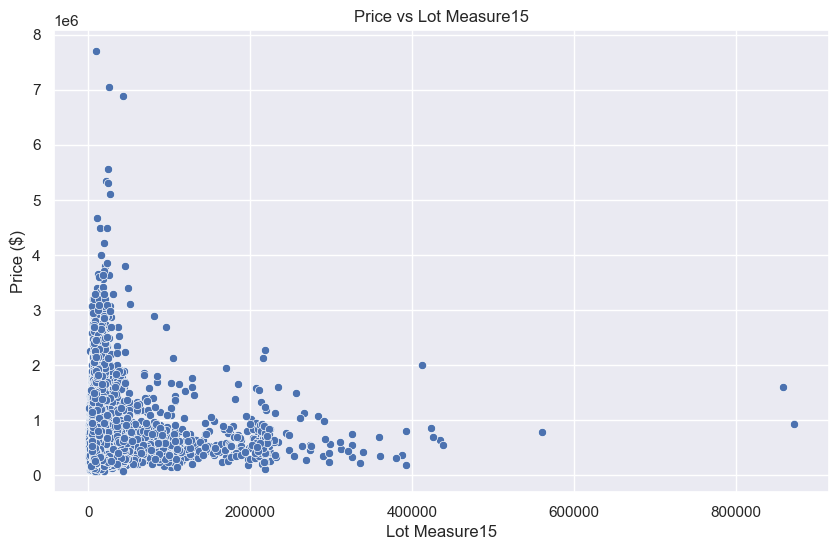

In [48]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='lot_measure15', y='price', data=df)

# Set the labels and title
plt.xlabel('Lot Measure15')
plt.ylabel('Price ($)')
plt.title('Price vs Lot Measure15')

# Show the plot
plt.show()

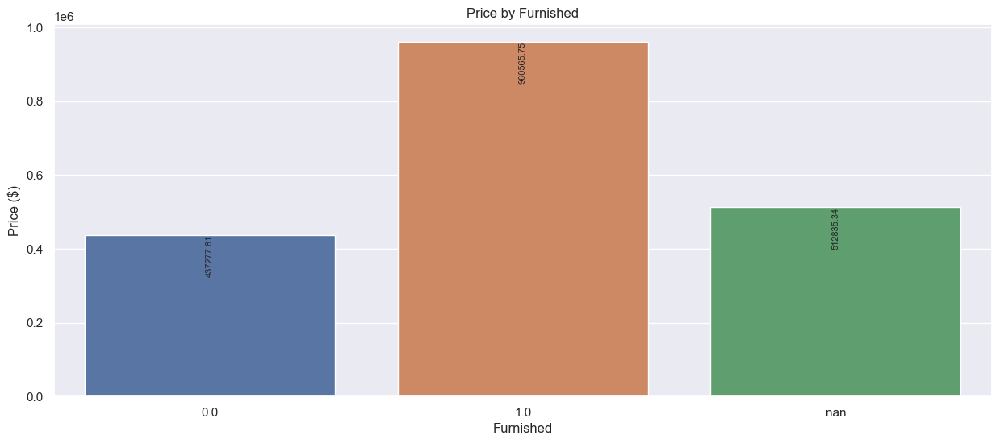

In [49]:
plt.figure(figsize=(15, 6))
sns.barplot(x='furnished', y='price', data=df, ci=None)

# Retrieve the current axes object
ax = plt.gca()

# Add value annotations on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='top', xytext=(0, 0), textcoords='offset points', rotation=90, fontsize=8)

# Set the labels and title
plt.xlabel('Furnished')
plt.ylabel('Price ($)')
plt.title('Price by Furnished')

# Show the plot
plt.show()

**There is lot of null values are present need to check whether we should drop it or fill with mode**

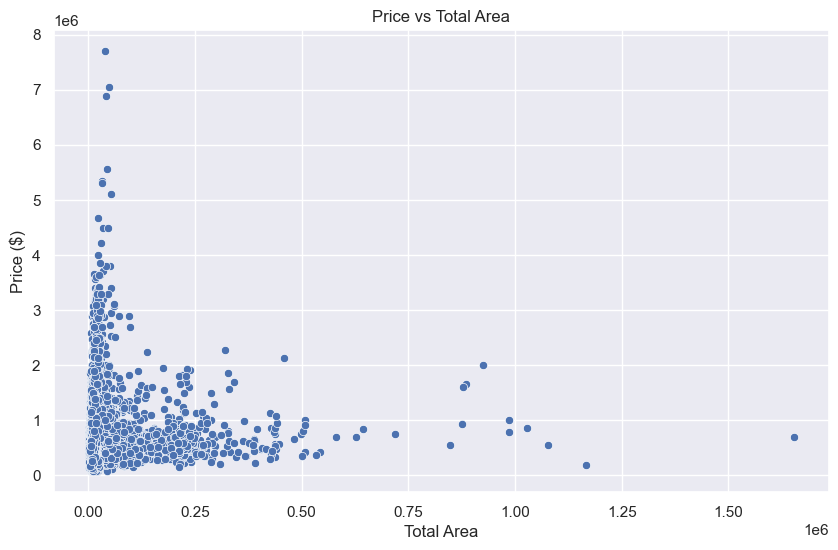

In [50]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='total_area', y='price', data=df)

# Set the labels and title
plt.xlabel('Total Area')
plt.ylabel('Price ($)')
plt.title('Price vs Total Area')

# Show the plot
plt.show()

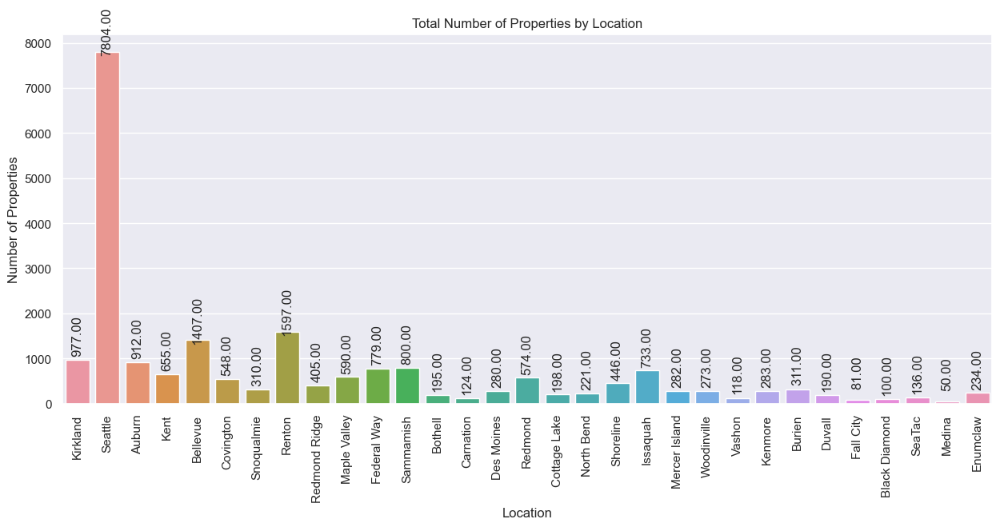

In [51]:
plt.figure(figsize=(15, 6))
sns.countplot(x='location', data=df)

# Retrieve the current axes object
ax = plt.gca()

# Add value annotations on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='top', xytext=(0, 40), textcoords='offset points', rotation=90)

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Set the labels and title
plt.xlabel('Location')
plt.ylabel('Number of Properties')
plt.title('Total Number of Properties by Location')

# Show the plot
plt.show()

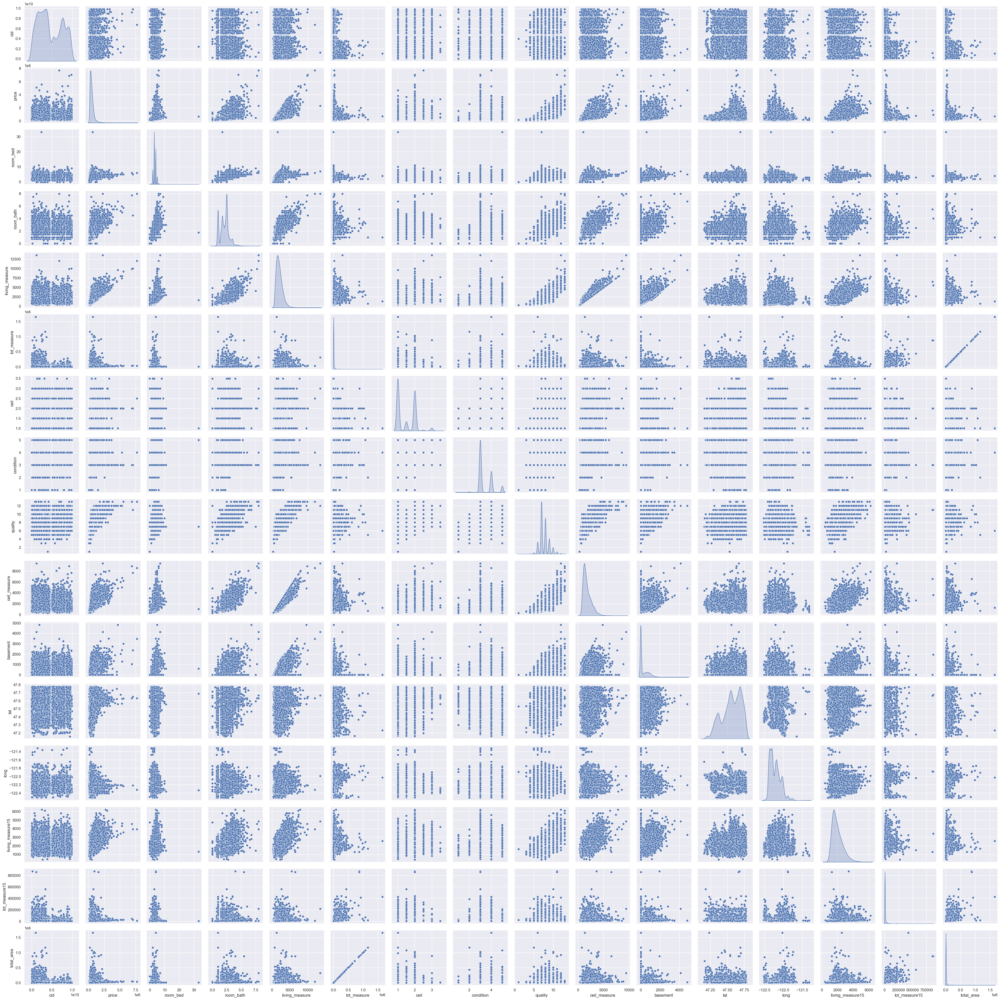

In [52]:
sns.pairplot(data = df, diag_kind = 'kde');

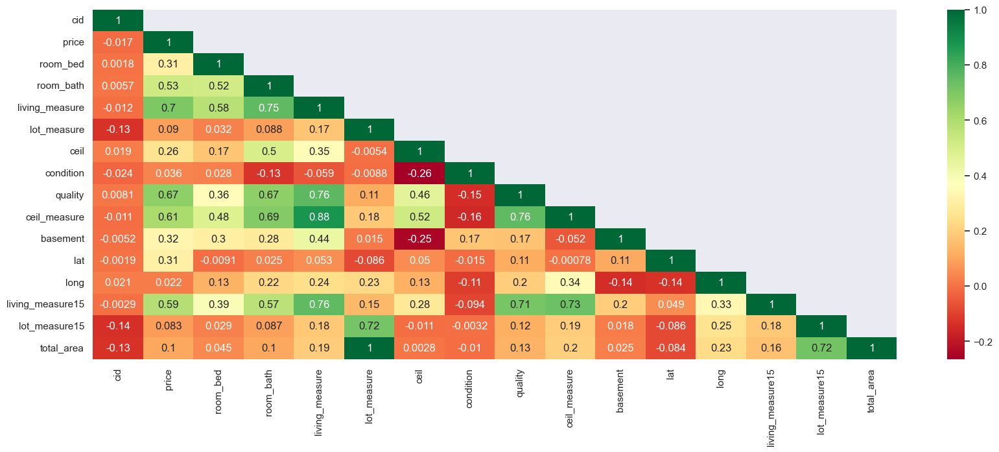

In [53]:
plt.figure(figsize=(20,7))
sns.heatmap(df.corr(),annot=True,mask=np.triu(df.corr(),+1),cmap='RdYlGn');

**Missing Value treatment (if applicable)**

In [54]:
df.isnull().sum()

cid                   0
dayhours              0
price                 0
room_bed            108
room_bath           108
living_measure       17
lot_measure          42
ceil                 72
coast                 0
sight                 0
condition            85
quality               1
ceil_measure          1
basement              1
yr_built              0
yr_renovated          0
zipcode               0
lat                   0
long                 34
living_measure15    166
lot_measure15        29
furnished             0
total_area           68
location              0
dtype: int64

In [55]:
null_percentage = df.isnull().mean() * 100
print(null_percentage)

cid                 0.000000
dayhours            0.000000
price               0.000000
room_bed            0.499699
room_bath           0.499699
living_measure      0.078656
lot_measure         0.194327
ceil                0.333133
coast               0.000000
sight               0.000000
condition           0.393282
quality             0.004627
ceil_measure        0.004627
basement            0.004627
yr_built            0.000000
yr_renovated        0.000000
zipcode             0.000000
lat                 0.000000
long                0.157313
living_measure15    0.768056
lot_measure15       0.134179
furnished           0.000000
total_area          0.314625
location            0.000000
dtype: float64


**Since the null value percentage is very low we can drop the columns containing null values**

In [56]:
df.dropna(inplace=True)

In [57]:
df.isnull().sum()

cid                 0
dayhours            0
price               0
room_bed            0
room_bath           0
living_measure      0
lot_measure         0
ceil                0
coast               0
sight               0
condition           0
quality             0
ceil_measure        0
basement            0
yr_built            0
yr_renovated        0
zipcode             0
lat                 0
long                0
living_measure15    0
lot_measure15       0
furnished           0
total_area          0
location            0
dtype: int64

In [58]:
for column in df.columns:
    # Get the descriptive statistics for the column
    stats = df[column].describe()
    # Print the column name and its descriptive statistics
    print(f"Column: {column}")
    print(stats)
    print()

Column: cid
count    2.128800e+04
mean     4.577499e+09
std      2.876915e+09
min      1.000102e+06
25%      2.122049e+09
50%      3.904921e+09
75%      7.305300e+09
max      9.900000e+09
Name: cid, dtype: float64

Column: dayhours
count                   21288
unique                    372
top       2014-06-23 00:00:00
freq                      140
first     2014-05-02 00:00:00
last      2015-05-27 00:00:00
Name: dayhours, dtype: object

Column: price
count    2.128800e+04
mean     5.399826e+05
std      3.656028e+05
min      7.500000e+04
25%      3.210202e+05
50%      4.500000e+05
75%      6.450000e+05
max      7.700000e+06
Name: price, dtype: float64

Column: room_bed
count    21288.000000
mean         3.370678
std          0.930123
min          0.000000
25%          3.000000
50%          3.000000
75%          4.000000
max         33.000000
Name: room_bed, dtype: float64

Column: room_bath
count    21288.000000
mean         2.114395
std          0.768666
min          0.000000
25%    

**Removal of unwanted variables (if applicable)**

In [59]:
df_2 = df.copy()

In [60]:
rows_to_drop = df_2[(df_2['room_bath'] == 0) & (df_2['room_bed'] == 0)]

# Print the rows to be dropped
rows_to_drop

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,location
3155,2954400190,2014-06-24,1300000,0.0,0.0,4810.0,28008.0,2.0,0.0,0.0,3.0,12.0,4810.0,0.0,1990.0,0,98053,47.6642,-122.069,4740.0,35061.0,1.0,32818.0,Redmond Ridge
3405,3980300371,2014-09-26,142000,0.0,0.0,290.0,20875.0,1.0,0.0,0.0,1.0,1.0,290.0,0.0,1963.0,0,98024,47.5308,-121.888,1620.0,22850.0,0.0,21165.0,Fall City
4238,7849202190,2014-12-23,235000,0.0,0.0,1470.0,4800.0,2.0,0.0,0.0,3.0,7.0,1470.0,0.0,1996.0,0,98065,47.5265,-121.828,1060.0,7200.0,0.0,6270.0,Snoqualmie
15593,3918400017,2015-02-05,380000,0.0,0.0,1470.0,979.0,3.0,0.0,2.0,3.0,8.0,1470.0,0.0,2006.0,0,98133,47.7145,-122.356,1470.0,1399.0,0.0,2449.0,Seattle
17704,3374500520,2015-04-29,355000,0.0,0.0,2460.0,8049.0,2.0,0.0,0.0,3.0,8.0,2460.0,0.0,1990.0,0,98031,47.4095,-122.168,2520.0,8050.0,0.0,10509.0,Kent
18596,9543000205,2015-04-13,139950,0.0,0.0,844.0,4269.0,1.0,0.0,0.0,4.0,7.0,844.0,0.0,1913.0,0,98001,47.2781,-122.250,1380.0,9600.0,0.0,5113.0,Auburn
20957,6306400140,2014-06-12,1100000,0.0,0.0,3064.0,4764.0,3.5,0.0,2.0,3.0,7.0,3064.0,0.0,1990.0,0,98102,47.6362,-122.322,2360.0,4000.0,0.0,7828.0,Seattle


**We can drop these rows containing room_bed = 0 and room_bath = 0**

In [61]:
df_3 = df_2.loc[(df_2['room_bath'] != 0) & (df_2['room_bed'] != 0)]

In [62]:
df_3[df_3['room_bed'] == 0].shape

(0, 24)

In [63]:
df_3[df_3['room_bath'] == 0].shape

(0, 24)

**Outlier treatment (if required)**

In [64]:
def zero_count(_series):
    counter=0
    for val in _series:
        if val==0:
            counter+=1
    return counter 

def negative_count(_series):
    counter=0
    for val in _series:
        if val < 0:
            counter+=1
    return counter 

def percent_outlier(_series):
    counter = 0
    lb = np.quantile(_series,.25) - (1.5*iqr(_series))
    ub = np.quantile(_series,.75) + (1.5*iqr(_series))
    for val in _series:
        if val>ub or val<lb: 
            counter=counter+1
        else : pass
    return 100*counter/len(_series)

stat_list = ['TOTAL RECORDS',
 'NULL COUNT',
 'ZERO COUNT',
 'NEGATIVE COUNT',
 'MIN',
 'MAX',
 'RANGE',
 'MEAN',
 'MEDIAN',
 'MODE',
 'VARIANCE',
 'STD DEV',
 'Q1',
 'Q3',
 'IQR',
 'SKEWNESS',
 'KURTOSIS']

def stat_function(_series):
    return [round(val,2) for val in 
          [len(_series),
           _series.isna().sum(),
           zero_count(_series),
           negative_count(_series),
           min(_series),
           max(_series),
           max(_series)-min(_series),
           _series.mean(),
           np.percentile(_series,.5),
           _series.mode()[0],
           st.variance(_series),
           st.stdev(_series),
           np.percentile(_series,.25),
           np.percentile(_series,.75),
           iqr(_series),
           stats.skew(_series),
           stats.kurtosis(_series)]
          ]

def stat_df(data, feature_list):
    stat_dictionary = {}
    for x in feature_list:
        stat_dictionary[x] = stat_function(data[x])
    return pd.DataFrame(stat_dictionary, index = stat_list).T

# Finding % Outliers in our Data
def outlier_percentage_df(data, features_list):
    dict_outlier = {}
    for x in features_list:
        dict_outlier[x]=round(percent_outlier(data[x]),2)
    return pd.DataFrame(dict_outlier, index=["% OUTLIERS"]).T.sort_values("% OUTLIERS", ascending=False)

In [65]:
categoriacl_features=[]
numerical_features=[]
for i in df_3.columns:
    if df_3[i].dtype=="object":
        categoriacl_features.append(i)
    else:
        numerical_features.append(i)
print(categoriacl_features) 
print(numerical_features)

['coast', 'sight', 'yr_built', 'yr_renovated', 'zipcode', 'furnished', 'location']
['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure', 'ceil', 'condition', 'quality', 'ceil_measure', 'basement', 'lat', 'long', 'living_measure15', 'lot_measure15', 'total_area']


In [66]:
from scipy.stats import iqr

In [67]:
outlier_percentage_df(df_3, numerical_features)

,% OUTLIERS
lot_measure,11.18
total_area,11.16
lot_measure15,10.14
quality,8.87
price,5.37
ceil_measure,2.83
living_measure,2.65
room_bath,2.59
living_measure15,2.52
room_bed,2.44


In [68]:
df_3['room_bath'].value_counts()

2.50    5297
1.00    3786
1.75    3008
2.25    2020
2.00    1899
1.50    1425
2.75    1167
3.00     737
3.50     721
3.25     582
3.75     153
4.00     135
4.50      97
4.25      78
0.75      71
4.75      22
5.00      20
5.25      12
5.50      10
1.25       9
6.00       6
5.75       4
0.50       4
6.75       2
8.00       2
6.50       2
6.25       2
7.50       1
Name: room_bath, dtype: int64

In [69]:
df_3.shape

(21272, 24)

In [70]:
outlier_percentage_df(df_3, numerical_features)

,% OUTLIERS
lot_measure,11.18
total_area,11.16
lot_measure15,10.14
quality,8.87
price,5.37
ceil_measure,2.83
living_measure,2.65
room_bath,2.59
living_measure15,2.52
room_bed,2.44


In [71]:

class_distribution = df_3['price'].value_counts()
class_frequencies = df_3['price'].value_counts(normalize=True)

print("Class Distribution:")
print(class_distribution)
print()

print("Class Frequencies:")
print(class_frequencies)

Class Distribution:
450000     170
350000     169
550000     155
500000     150
425000     147
          ... 
2550000      1
653675       1
605125       1
741500       1
685530       1
Name: price, Length: 3596, dtype: int64

Class Frequencies:
450000     0.007992
350000     0.007945
550000     0.007287
500000     0.007052
425000     0.006910
             ...   
2550000    0.000047
653675     0.000047
605125     0.000047
741500     0.000047
685530     0.000047
Name: price, Length: 3596, dtype: float64


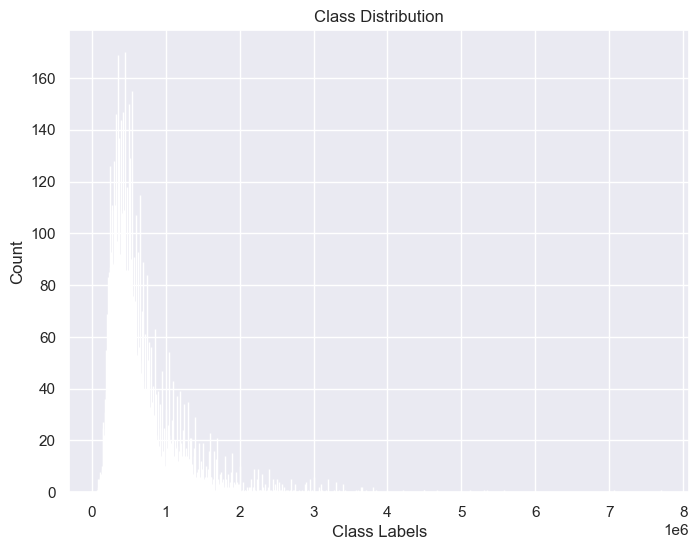

Class 450000: 0.01
Class 350000: 0.01
Class 550000: 0.01
Class 500000: 0.01
Class 425000: 0.01
Class 325000: 0.01
Class 400000: 0.01
Class 375000: 0.01
Class 525000: 0.01
Class 300000: 0.01
Class 250000: 0.01
Class 475000: 0.01
Class 330000: 0.01
Class 650000: 0.01
Class 315000: 0.01
Class 275000: 0.01
Class 440000: 0.01
Class 280000: 0.01
Class 390000: 0.01
Class 415000: 0.01
Class 600000: 0.01
Class 320000: 0.00
Class 435000: 0.00
Class 310000: 0.00
Class 335000: 0.00
Class 340000: 0.00
Class 360000: 0.00
Class 420000: 0.00
Class 260000: 0.00
Class 625000: 0.00
Class 265000: 0.00
Class 380000: 0.00
Class 575000: 0.00
Class 530000: 0.00
Class 270000: 0.00
Class 430000: 0.00
Class 700000: 0.00
Class 345000: 0.00
Class 290000: 0.00
Class 370000: 0.00
Class 245000: 0.00
Class 305000: 0.00
Class 490000: 0.00
Class 355000: 0.00
Class 465000: 0.00
Class 255000: 0.00
Class 230000: 0.00
Class 385000: 0.00
Class 750000: 0.00
Class 410000: 0.00
Class 515000: 0.00
Class 225000: 0.00
Class 485000

In [72]:

target_counts = df_3['price'].value_counts()
class_labels = target_counts.index
class_counts = target_counts.values

# Calculate the proportion of each class
class_proportions = class_counts / class_counts.sum()

# Plot the class distribution
plt.figure(figsize=(8, 6))
plt.bar(class_labels, class_counts)
plt.xlabel('Class Labels')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.show()

# Print the class proportions
for label, proportion in zip(class_labels, class_proportions):
    print(f"Class {label}: {proportion:.2f}")


In [73]:
sns.set()
sns.set_palette(palette='deep')
import folium
from folium.plugins import FastMarkerCluster

In [74]:
## Let's study Latitude and Longitue features 

lat = df_3['lat'].tolist()
lon = df_3['long'].tolist()
locations = list(zip(lat, lon))

# 47.6062° N, -122.3321° W is the latitude and longitude of Seattle

map1 = folium.Map(location=[47.6062, -122.3321], zoom_start=12)
FastMarkerCluster(locations).add_to(map1)
map1

In [75]:
print("0.5% properties have a price lower than {0: .2f}".format(np.percentile(df_3["price"], 0.5)))
print("  1% properties have a price lower than {0: .2f}".format(np.percentile(df_3["price"], 1)))
print("  5% properties have a price lower than {0: .2f}".format(np.percentile(df_3["price"], 5)))
print(" 10% properties have a price lower than {0: .2f}".format(np.percentile(df_3["price"], 10)))
print(" 90% properties have a price lower than {0: .2f}".format(np.percentile(df_3["price"], 90)))
print(" 95% properties have a price lower than {0: .2f}".format(np.percentile(df_3["price"], 95)))
print(" 99% properties have a price lower than {0: .2f}".format(np.percentile(df_3["price"], 99)))
print("99.5% properties have a price lower than {0: .2f}".format(np.percentile(df_3["price"], 99.5)))

0.5% properties have a price lower than  135000.00
  1% properties have a price lower than  154413.00
  5% properties have a price lower than  210000.00
 10% properties have a price lower than  245000.00
 90% properties have a price lower than  887245.00
 95% properties have a price lower than  1160000.00
 99% properties have a price lower than  1970000.00
99.5% properties have a price lower than  2456450.00


In [76]:
from scipy.cluster.hierarchy import dendrogram, linkage

In [77]:
df_3.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,location
0,3876100940,2015-04-27,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0,Kirkland
1,3145600250,2015-03-17,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0,Seattle
2,7129303070,2014-08-20,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,1966.0,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0,Seattle
3,7338220280,2014-10-10,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0,Auburn
4,7950300670,2015-02-18,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0,Seattle


In [78]:
df_4 = df_3.copy()

In [79]:
data = df_4.iloc[:,2:22]
data.head()

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished
0,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,0,98034,47.7228,-122.183,2020.0,8660.0,0.0
1,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,0,98118,47.5546,-122.274,1660.0,4100.0,0.0
2,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,1966.0,0,98118,47.5188,-122.256,2620.0,2433.0,0.0
3,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,0,98002,47.3363,-122.213,2030.0,3794.0,0.0
4,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,0,98118,47.5663,-122.285,1120.0,5100.0,0.0


In [80]:
df_4.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,location
0,3876100940,2015-04-27,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0,Kirkland
1,3145600250,2015-03-17,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0,Seattle
2,7129303070,2014-08-20,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,1966.0,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0,Seattle
3,7338220280,2014-10-10,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0,Auburn
4,7950300670,2015-02-18,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0,Seattle


In [81]:
df_4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21272 entries, 0 to 21612
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   cid               21272 non-null  int64         
 1   dayhours          21272 non-null  datetime64[ns]
 2   price             21272 non-null  int64         
 3   room_bed          21272 non-null  float64       
 4   room_bath         21272 non-null  float64       
 5   living_measure    21272 non-null  float64       
 6   lot_measure       21272 non-null  float64       
 7   ceil              21272 non-null  float64       
 8   coast             21272 non-null  object        
 9   sight             21272 non-null  object        
 10  condition         21272 non-null  float64       
 11  quality           21272 non-null  float64       
 12  ceil_measure      21272 non-null  float64       
 13  basement          21272 non-null  float64       
 14  yr_built          2127

In [82]:
df_4['ceil'].unique()

array([1. , 2. , 3. , 1.5, 2.5, 3.5])

In [83]:
df_4['ceil'] = df_4['ceil'].astype('object')

In [84]:
df_4['condition'] = df_4['condition'].astype('object')

In [85]:
df_4['quality'].unique()

array([ 8.,  6.,  7., 10.,  9.,  5., 11., 13.,  4., 12.,  3.])

In [86]:
df_5 = df_4.copy()

In [87]:
df_5['yr_renovated'] = df_5['yr_renovated'].replace(0, 'no')


In [88]:
df_5.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,location
0,3876100940,2015-04-27,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0,Kirkland
1,3145600250,2015-03-17,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0,Seattle
2,7129303070,2014-08-20,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,1966.0,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0,Seattle
3,7338220280,2014-10-10,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0,Auburn
4,7950300670,2015-02-18,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0,Seattle


In [89]:
df_5['yr_renovated'] = df_5['yr_renovated'].apply(lambda x: 'NO' if x != 0 else 'YES')

In [90]:
df_5.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,location
0,3876100940,2015-04-27,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,NO,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0,Kirkland
1,3145600250,2015-03-17,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,NO,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0,Seattle
2,7129303070,2014-08-20,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,1966.0,NO,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0,Seattle
3,7338220280,2014-10-10,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,NO,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0,Auburn
4,7950300670,2015-02-18,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,NO,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0,Seattle


In [91]:
df_5['sold year'] = df_5['dayhours'].dt.year

In [92]:
df_5.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,location,sold year
0,3876100940,2015-04-27,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,NO,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0,Kirkland,2015
1,3145600250,2015-03-17,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,NO,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0,Seattle,2015
2,7129303070,2014-08-20,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,1966.0,NO,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0,Seattle,2014
3,7338220280,2014-10-10,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,NO,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0,Auburn,2014
4,7950300670,2015-02-18,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,NO,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0,Seattle,2015


In [93]:
df_5['yr_built'] = df_5['yr_built'].astype('float')

In [94]:
df_5['Age_of_House'] = df_5['sold year'] - df_5['yr_built']

In [95]:
df_5.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,location,sold year,Age_of_House
0,3876100940,2015-04-27,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,NO,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0,Kirkland,2015,49.0
1,3145600250,2015-03-17,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,NO,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0,Seattle,2015,67.0
2,7129303070,2014-08-20,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,1966.0,NO,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0,Seattle,2014,48.0
3,7338220280,2014-10-10,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,NO,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0,Auburn,2014,5.0
4,7950300670,2015-02-18,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,NO,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0,Seattle,2015,91.0


In [96]:
df_5["location"].value_counts()

Seattle          7673
Renton           1579
Bellevue         1383
Kirkland          962
Auburn            892
Sammamish         788
Federal Way       769
Issaquah          726
Kent              644
Maple Valley      582
Redmond           566
Covington         540
Shoreline         442
Redmond Ridge     391
Burien            305
Snoqualmie        303
Kenmore           279
Mercer Island     279
Des Moines        278
Woodinville       272
Enumclaw          230
North Bend        218
Cottage Lake      195
Bothell           192
Duvall            188
SeaTac            133
Carnation         121
Vashon            116
Black Diamond      97
Fall City          80
Medina             49
Name: location, dtype: int64

In [97]:
location_counts = df_5['location'].value_counts()
less_than_200 = location_counts[location_counts < 200].index
df_5['location'] = df_5['location'].replace(less_than_200, 'Others')


In [98]:
df_5["location"].value_counts()

Seattle          7673
Renton           1579
Bellevue         1383
Others           1171
Kirkland          962
Auburn            892
Sammamish         788
Federal Way       769
Issaquah          726
Kent              644
Maple Valley      582
Redmond           566
Covington         540
Shoreline         442
Redmond Ridge     391
Burien            305
Snoqualmie        303
Mercer Island     279
Kenmore           279
Des Moines        278
Woodinville       272
Enumclaw          230
North Bend        218
Name: location, dtype: int64

In [99]:
df_6 = df_5.copy()

In [100]:
df_6.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished', 'total_area', 'location', 'sold year', 'Age_of_House'], dtype='object')

In [101]:
columns_to_remove = ['cid', 'dayhours', 'lot_measure', 'yr_built', 'zipcode', 'lat', 'long','sold year']  # List of columns to remove
df_6 = df_6.drop(columns=columns_to_remove)

In [102]:
df_6.head()

,price,room_bed,room_bath,living_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_renovated,living_measure15,lot_measure15,furnished,total_area,location,Age_of_House
0,600000,4.0,1.75,3050.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,NO,2020.0,8660.0,0.0,12490.0,Kirkland,49.0
1,190000,2.0,1.00,670.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,NO,1660.0,4100.0,0.0,3771.0,Seattle,67.0
2,735000,4.0,2.75,3040.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,NO,2620.0,2433.0,0.0,5455.0,Seattle,48.0
3,257000,3.0,2.50,1740.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,NO,2030.0,3794.0,0.0,5461.0,Auburn,5.0
4,450000,2.0,1.00,1120.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,NO,1120.0,5100.0,0.0,5710.0,Seattle,91.0


In [103]:
df_7 = df_6.copy()

In [104]:
columns_to_remove = ['ceil', 'coast', 'sight', 'condition', 'yr_renovated', 'furnished', 'location']  # List of columns to remove
df_7 = df_7.drop(columns=columns_to_remove)

In [105]:
df_7.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21272 entries, 0 to 21612
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   price             21272 non-null  int64  
 1   room_bed          21272 non-null  float64
 2   room_bath         21272 non-null  float64
 3   living_measure    21272 non-null  float64
 4   quality           21272 non-null  float64
 5   ceil_measure      21272 non-null  float64
 6   basement          21272 non-null  float64
 7   living_measure15  21272 non-null  float64
 8   lot_measure15     21272 non-null  float64
 9   total_area        21272 non-null  float64
 10  Age_of_House      21272 non-null  float64
dtypes: float64(10), int64(1)
memory usage: 1.9 MB


In [106]:
df_7['room_bed'].value_counts()

3.0     9672
4.0     6783
2.0     2720
5.0     1577
6.0      266
1.0      193
7.0       38
8.0       12
9.0        6
10.0       3
33.0       1
11.0       1
Name: room_bed, dtype: int64

In [107]:
df_7.shape

(21272, 11)

In [108]:
df_7 = df_7[df_7['room_bed'] <= 9]

In [109]:
df_7.shape

(21267, 11)

In [110]:
from scipy.stats import zscore
df_scaled =  df_7.apply(zscore)
df_scaled.head()

,price,room_bed,room_bath,living_measure,quality,ceil_measure,basement,living_measure15,lot_measure15,total_area,Age_of_House
0,0.163955,0.700442,-0.476121,1.057304,0.290345,0.013211,2.167309,0.047778,-0.150316,-0.112821,0.194333
1,-0.957441,-1.524546,-1.453721,-1.537620,-1.413039,-1.352771,-0.658227,-0.477271,-0.317796,-0.322450,0.806825
2,0.533196,0.700442,0.827347,1.046401,0.290345,1.512165,-0.658227,0.922859,-0.379022,-0.281962,0.160306
3,-0.774188,-0.412052,0.501480,-0.370995,0.290345,-0.059319,-0.658227,0.062362,-0.329035,-0.281818,-1.302867
4,-0.246312,-1.524546,-1.453721,-1.046983,-0.561347,-0.808796,-0.658227,-1.264844,-0.281068,-0.275831,1.623479


In [111]:
import scipy.cluster.hierarchy as shc

In [112]:
from sklearn.preprocessing import StandardScaler
X = StandardScaler()
df_scaled1 =  X.fit_transform(df_7)
df_scaled1 = pd.DataFrame(df_scaled1,columns=df_7.columns)
df_scaled1.head()

,price,room_bed,room_bath,living_measure,quality,ceil_measure,basement,living_measure15,lot_measure15,total_area,Age_of_House
0,0.163955,0.700442,-0.476121,1.057304,0.290345,0.013211,2.167309,0.047778,-0.150316,-0.112821,0.194333
1,-0.957441,-1.524546,-1.453721,-1.537620,-1.413039,-1.352771,-0.658227,-0.477271,-0.317796,-0.322450,0.806825
2,0.533196,0.700442,0.827347,1.046401,0.290345,1.512165,-0.658227,0.922859,-0.379022,-0.281962,0.160306
3,-0.774188,-0.412052,0.501480,-0.370995,0.290345,-0.059319,-0.658227,0.062362,-0.329035,-0.281818,-1.302867
4,-0.246312,-1.524546,-1.453721,-1.046983,-0.561347,-0.808796,-0.658227,-1.264844,-0.281068,-0.275831,1.623479


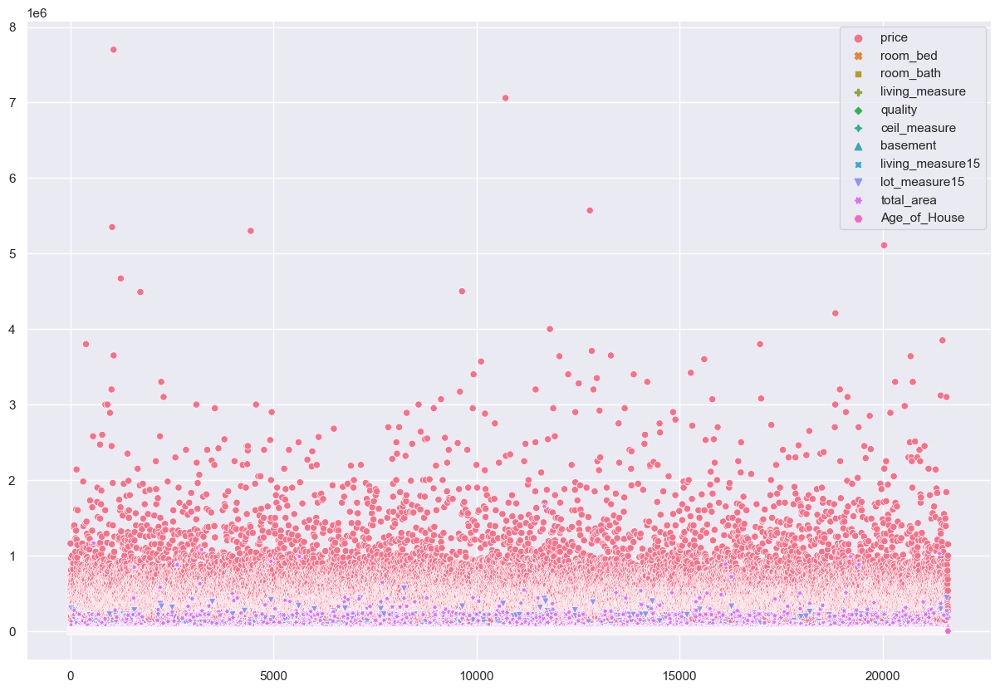

In [113]:
plt.figure(figsize=(15,10))
sns.scatterplot(data = df_7);

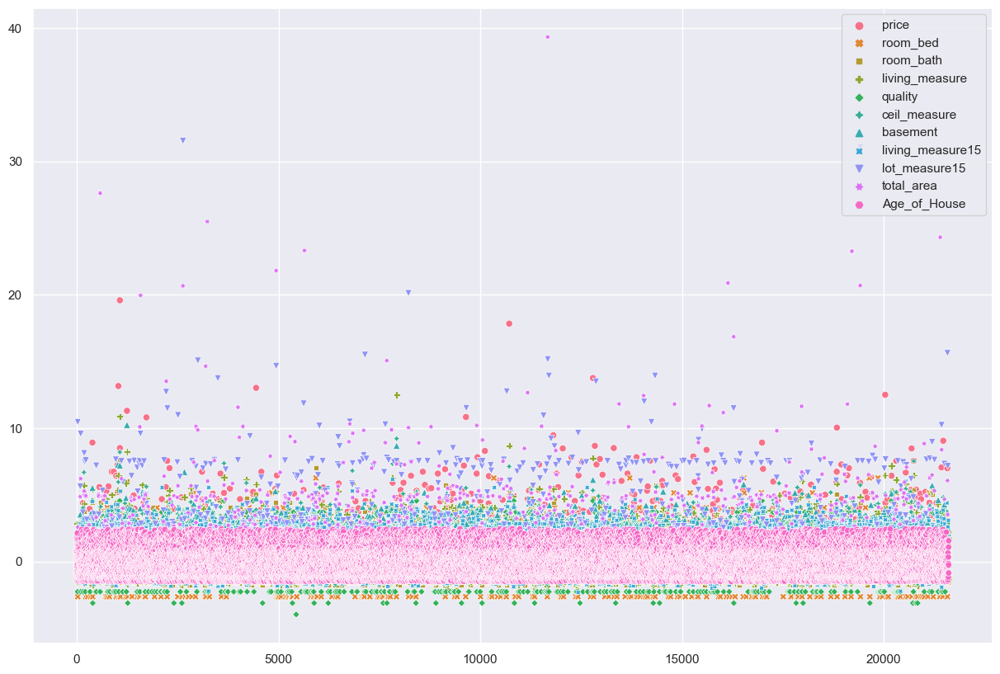

In [114]:
plt.figure(figsize=(15,10))
sns.scatterplot(data = df_scaled);

In [115]:
df_7['room_bath'].value_counts()

2.50    5297
1.00    3786
1.75    3007
2.25    2020
2.00    1898
1.50    1425
2.75    1167
3.00     735
3.50     721
3.25     582
3.75     153
4.00     135
4.50      97
4.25      78
0.75      71
4.75      22
5.00      20
5.25      11
5.50      10
1.25       9
6.00       6
5.75       4
0.50       4
6.75       2
8.00       2
6.50       2
6.25       2
7.50       1
Name: room_bath, dtype: int64

In [116]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, random_state = 1)
    kmeans.fit(df_scaled1)
    # inertia method returns wcss for that model
    wcss.append(kmeans.inertia_)

In [117]:
for i in range(2,11):
    print('The WSS value for',i,'clusters is',wcss[i-2])

The WSS value for 2 clusters is 233936.99999999983
The WSS value for 3 clusters is 166232.98792943594
The WSS value for 4 clusters is 143525.72848435727
The WSS value for 5 clusters is 122267.28028157115
The WSS value for 6 clusters is 108475.9492335431
The WSS value for 7 clusters is 98240.04469691141
The WSS value for 8 clusters is 93160.2080338166
The WSS value for 9 clusters is 88563.25468358482
The WSS value for 10 clusters is 84189.24255236587


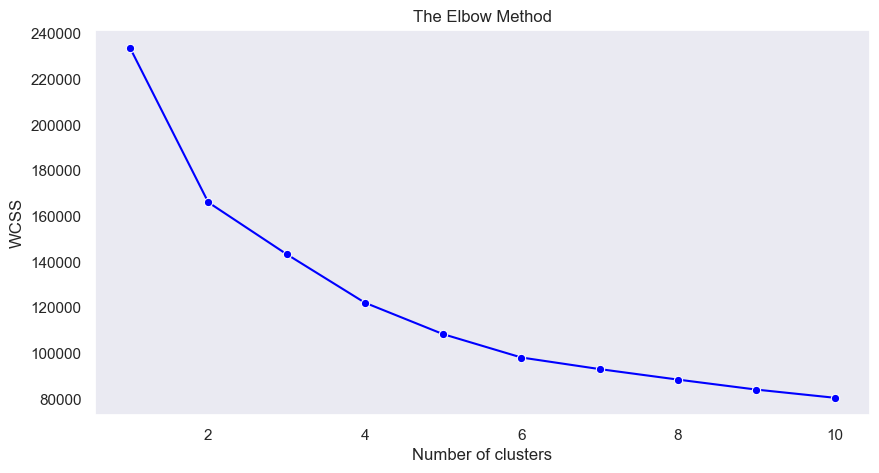

In [118]:
plt.figure(figsize=(10,5))
sns.lineplot(range(1, 11), wcss,marker='o',color='blue')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.grid()
plt.show()

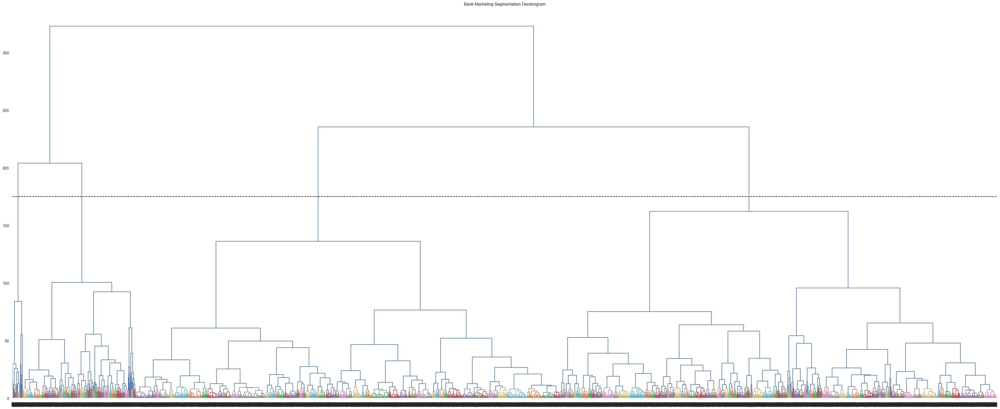

In [119]:
plt.figure(figsize=(50, 20))
plt.title("Bank Marketing Segmentation Dendrogram")
dend = shc.dendrogram(shc.linkage(df_scaled, method='ward'),color_threshold=10)
plt.axhline(175, color='black', linestyle='--')
plt.show()

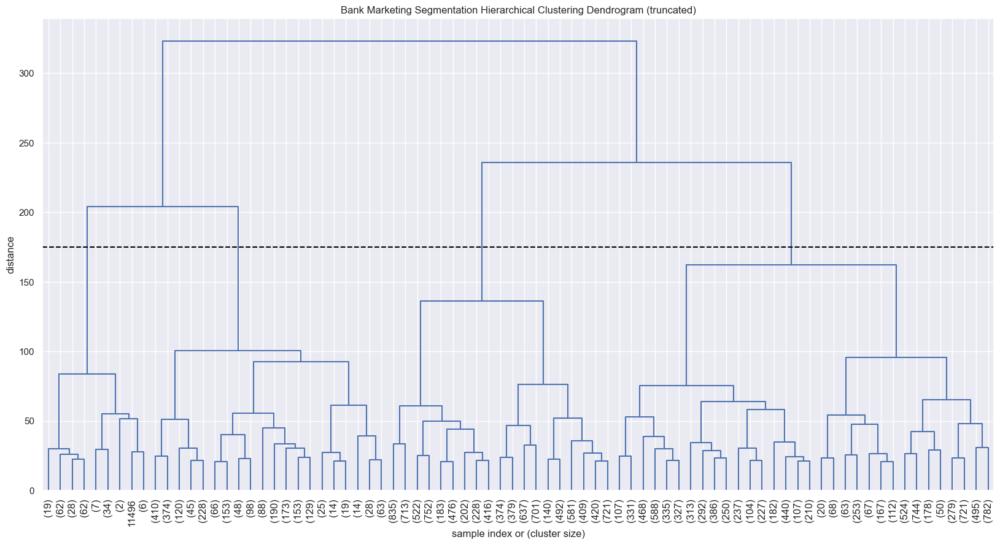

In [120]:
from scipy.cluster.hierarchy import dendrogram, linkage
Z_Final = linkage(df_scaled, 'ward', metric='euclidean')
plt.figure(figsize=(20, 10))
plt.title('Bank Marketing Segmentation Hierarchical Clustering Dendrogram (truncated)')
plt.xlabel('sample index or (cluster size)')
plt.ylabel('distance')
dendrogram(
    Z_Final,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=80,  # show only the last p merged clusters
    leaf_rotation=90,
    leaf_font_size=12,
    color_threshold=10
)
plt.axhline(175, color='black', linestyle='--')
plt.show()

In [121]:
clusters_1 = shc.fcluster(shc.linkage(df_scaled, method='ward'), 4, criterion='maxclust')# Here 3 is number of clusters we want
clusters_1

array([4, 3, 4, ..., 4, 4, 4], dtype=int32)

In [122]:
df_5 = df_5[df_5['room_bed'] <= 9]

In [123]:
df_6 = df_6[df_6['room_bed'] <= 9]

In [124]:
df_6['cluster_1']= clusters_1
df_6.head()

,price,room_bed,room_bath,living_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_renovated,living_measure15,lot_measure15,furnished,total_area,location,Age_of_House,cluster_1
0,600000,4.0,1.75,3050.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,NO,2020.0,8660.0,0.0,12490.0,Kirkland,49.0,4
1,190000,2.0,1.00,670.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,NO,1660.0,4100.0,0.0,3771.0,Seattle,67.0,3
2,735000,4.0,2.75,3040.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,NO,2620.0,2433.0,0.0,5455.0,Seattle,48.0,4
3,257000,3.0,2.50,1740.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,NO,2030.0,3794.0,0.0,5461.0,Auburn,5.0,4
4,450000,2.0,1.00,1120.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,NO,1120.0,5100.0,0.0,5710.0,Seattle,91.0,3


In [125]:
df_5['cluster_1']= clusters_1
df_5.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,location,sold year,Age_of_House,cluster_1
0,3876100940,2015-04-27,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,NO,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0,Kirkland,2015,49.0,4
1,3145600250,2015-03-17,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,NO,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0,Seattle,2015,67.0,3
2,7129303070,2014-08-20,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,1966.0,NO,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0,Seattle,2014,48.0,4
3,7338220280,2014-10-10,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,NO,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0,Auburn,2014,5.0,4
4,7950300670,2015-02-18,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,NO,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0,Seattle,2015,91.0,3


In [126]:
df_5.to_csv('output.csv', index=False)

In [127]:
df_clust_1 = df_6.groupby('cluster_1').mean()
cluster_1_freq = df_6['cluster_1'].value_counts().sort_index()
df_clust_1['cluster count'] = cluster_1_freq
df_clust_1

,price,room_bed,room_bath,living_measure,quality,ceil_measure,basement,living_measure15,lot_measure15,total_area,Age_of_House,cluster count
cluster_1,,,,,,,,,,,,
1,6.047260e+05,3.262443,2.343891,2618.597285,8.049774,2416.266968,202.330317,2342.809955,220259.583710,272410.022624,31.497738,221
2,1.181114e+06,4.108285,3.140792,3751.379820,9.751846,3212.150123,539.229696,3135.079573,16491.632075,23671.781788,27.194011,2438
3,3.695652e+05,2.797517,1.600588,1378.928330,6.926370,1273.590350,105.337981,1530.984751,6960.728025,8692.708202,51.724322,9181
4,5.387905e+05,3.740002,2.345948,2318.502705,7.822319,1908.362151,410.140554,2126.403204,12561.830593,17789.194441,39.512464,9427


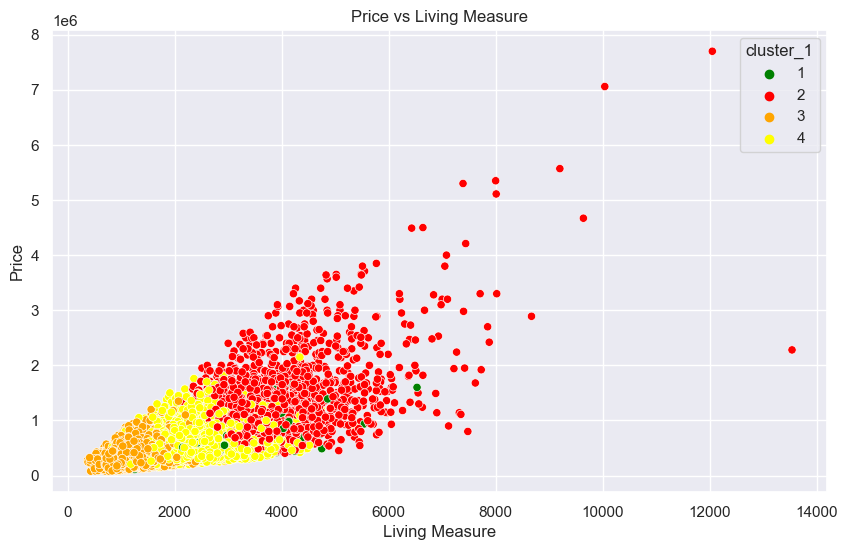

In [128]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='living_measure', y='price', data=df_6, hue = 'cluster_1', 
                    palette=['green','red','orange','yellow'], legend='full')

# Set the labels and title
plt.xlabel('Living Measure')
plt.ylabel('Price')
plt.title('Price vs Living Measure')

# Show the plot
plt.show()

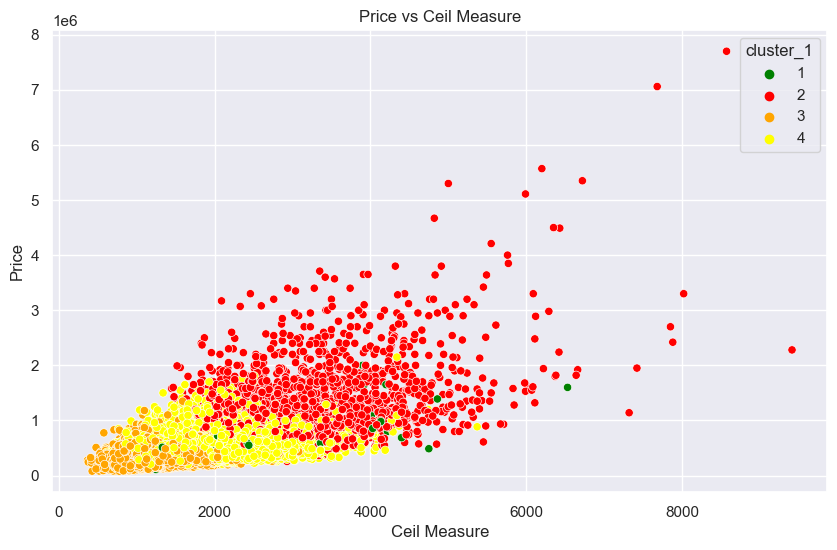

In [129]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='ceil_measure', y='price', data=df_6, hue = 'cluster_1', 
                    palette=['green','red','orange','yellow'], legend='full')

# Set the labels and title
plt.xlabel('Ceil Measure')
plt.ylabel('Price')
plt.title('Price vs Ceil Measure')

# Show the plot
plt.show()

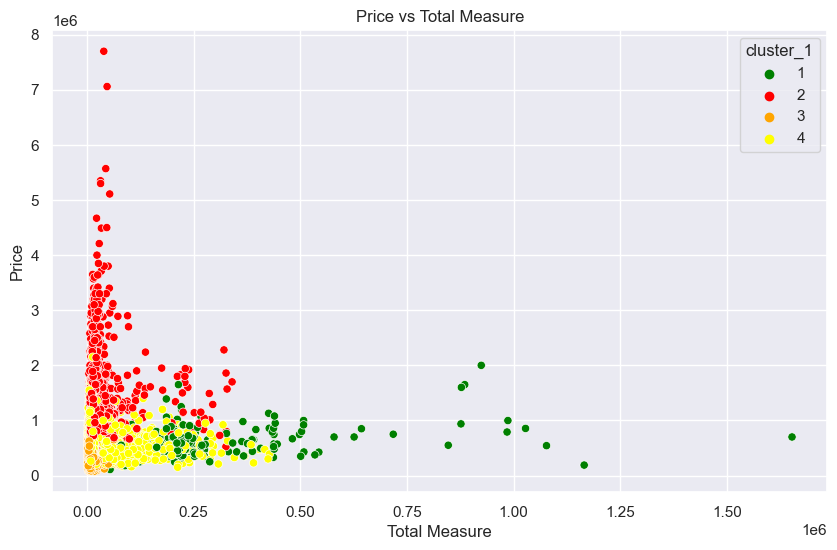

In [130]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='total_area', y='price', data=df_6, hue = 'cluster_1', 
                    palette=['green','red','orange','yellow'], legend='full')

# Set the labels and title
plt.xlabel('Total Measure')
plt.ylabel('Price')
plt.title('Price vs Total Measure')

# Show the plot
plt.show()

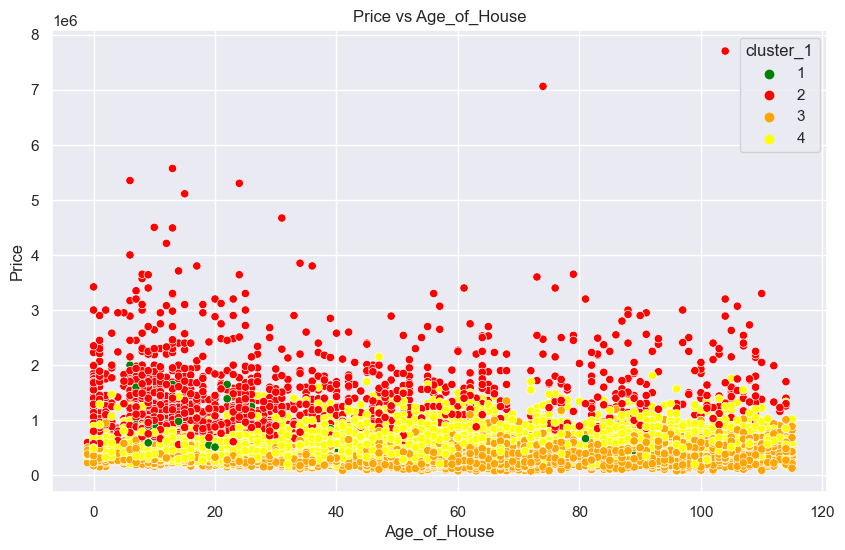

In [131]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Age_of_House', y='price', data=df_6, hue = 'cluster_1', 
                    palette=['green','red','orange','yellow'])

# Set the labels and title
plt.xlabel('Age_of_House')
plt.ylabel('Price')
plt.title('Price vs Age_of_House')

# Show the plot
plt.show()

In [132]:
df_8 = df_6.copy()
df_8.head()

,price,room_bed,room_bath,living_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_renovated,living_measure15,lot_measure15,furnished,total_area,location,Age_of_House,cluster_1
0,600000,4.0,1.75,3050.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,NO,2020.0,8660.0,0.0,12490.0,Kirkland,49.0,4
1,190000,2.0,1.00,670.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,NO,1660.0,4100.0,0.0,3771.0,Seattle,67.0,3
2,735000,4.0,2.75,3040.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,NO,2620.0,2433.0,0.0,5455.0,Seattle,48.0,4
3,257000,3.0,2.50,1740.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,NO,2030.0,3794.0,0.0,5461.0,Auburn,5.0,4
4,450000,2.0,1.00,1120.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,NO,1120.0,5100.0,0.0,5710.0,Seattle,91.0,3


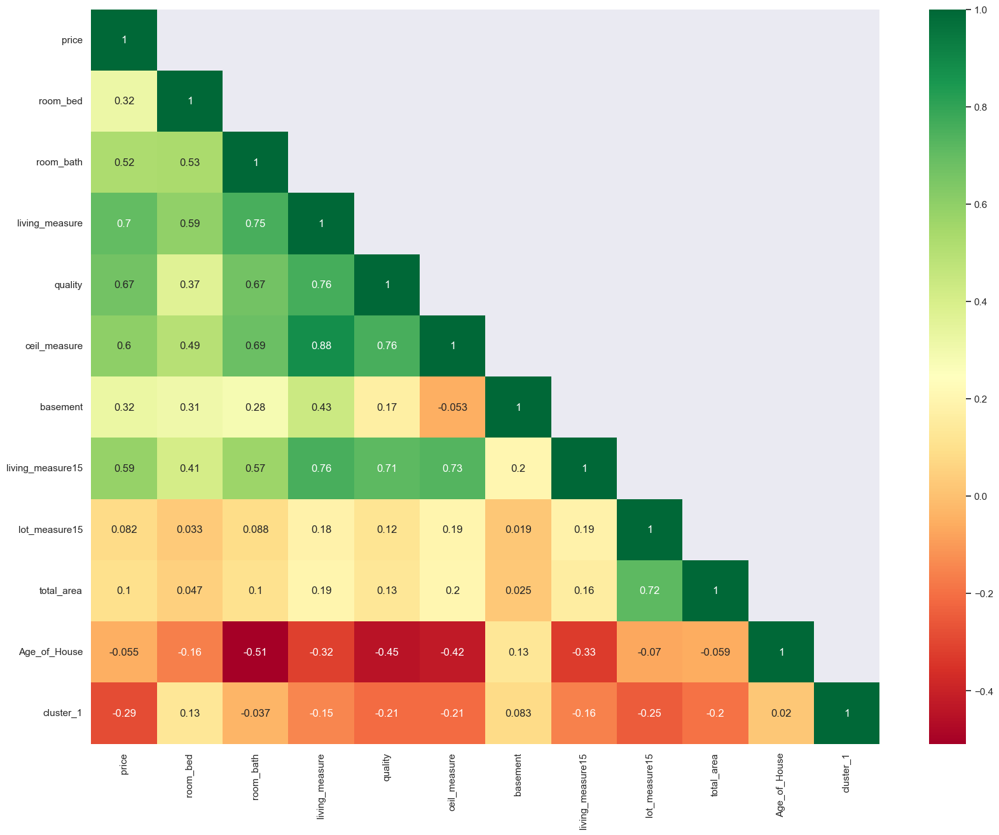

In [133]:
plt.figure(figsize=(20,15))
sns.heatmap(df_8.corr(),annot=True,mask=np.triu(df_8.corr(),+1),cmap='RdYlGn');


In [134]:
df_8 = df_8.drop('cluster_1', axis=1)

In [135]:
df_8 = df_8.drop('living_measure', axis=1)

In [136]:
df_dummies = pd.get_dummies(df_8, drop_first=True)
df_dummies.head()

,price,room_bed,room_bath,quality,ceil_measure,basement,living_measure15,lot_measure15,total_area,Age_of_House,ceil_1.5,ceil_2.0,ceil_2.5,ceil_3.0,ceil_3.5,coast_1.0,sight_1.0,sight_2.0,sight_3.0,sight_4.0,condition_2.0,condition_3.0,condition_4.0,condition_5.0,furnished_1.0,location_Bellevue,location_Burien,location_Covington,location_Des Moines,location_Enumclaw,location_Federal Way,location_Issaquah,location_Kenmore,location_Kent,location_Kirkland,location_Maple Valley,location_Mercer Island,location_North Bend,location_Others,location_Redmond,location_Redmond Ridge,location_Renton,location_Sammamish,location_Seattle,location_Shoreline,location_Snoqualmie,location_Woodinville
0,600000,4.0,1.75,8.0,1800.0,1250.0,2020.0,8660.0,12490.0,49.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,190000,2.0,1.00,6.0,670.0,0.0,1660.0,4100.0,3771.0,67.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,735000,4.0,2.75,8.0,3040.0,0.0,2620.0,2433.0,5455.0,48.0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3,257000,3.0,2.50,8.0,1740.0,0.0,2030.0,3794.0,5461.0,5.0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,450000,2.0,1.00,7.0,1120.0,0.0,1120.0,5100.0,5710.0,91.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


## Linear Regression

In [137]:
# independent variables
X = df_dummies.drop(["price"], axis=1)
# dependent variable
y = df_dummies[["price"]]

In [138]:
X = sm.add_constant(X)

In [139]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=1
)

In [140]:
X_train.head()

,const,room_bed,room_bath,quality,ceil_measure,basement,living_measure15,lot_measure15,total_area,Age_of_House,ceil_1.5,ceil_2.0,ceil_2.5,ceil_3.0,ceil_3.5,coast_1.0,sight_1.0,sight_2.0,sight_3.0,sight_4.0,condition_2.0,condition_3.0,condition_4.0,condition_5.0,furnished_1.0,location_Bellevue,location_Burien,location_Covington,location_Des Moines,location_Enumclaw,location_Federal Way,location_Issaquah,location_Kenmore,location_Kent,location_Kirkland,location_Maple Valley,location_Mercer Island,location_North Bend,location_Others,location_Redmond,location_Redmond Ridge,location_Renton,location_Sammamish,location_Seattle,location_Shoreline,location_Snoqualmie,location_Woodinville
1173,1.0,2.0,1.75,6.0,940.0,60.0,1900.0,5100.0,6100.0,108.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
19780,1.0,3.0,1.50,7.0,1380.0,0.0,1420.0,8187.0,8037.0,29.0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
5006,1.0,2.0,1.50,7.0,1240.0,580.0,1400.0,7800.0,9620.0,58.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
16011,1.0,3.0,2.25,8.0,1640.0,0.0,1830.0,8372.0,8840.0,29.0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
540,1.0,3.0,2.50,9.0,2280.0,0.0,2200.0,5000.0,7280.0,88.0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [141]:
X_test.head()

,const,room_bed,room_bath,quality,ceil_measure,basement,living_measure15,lot_measure15,total_area,Age_of_House,ceil_1.5,ceil_2.0,ceil_2.5,ceil_3.0,ceil_3.5,coast_1.0,sight_1.0,sight_2.0,sight_3.0,sight_4.0,condition_2.0,condition_3.0,condition_4.0,condition_5.0,furnished_1.0,location_Bellevue,location_Burien,location_Covington,location_Des Moines,location_Enumclaw,location_Federal Way,location_Issaquah,location_Kenmore,location_Kent,location_Kirkland,location_Maple Valley,location_Mercer Island,location_North Bend,location_Others,location_Redmond,location_Redmond Ridge,location_Renton,location_Sammamish,location_Seattle,location_Shoreline,location_Snoqualmie,location_Woodinville
3461,1.0,3.0,2.50,8.0,1880.0,280.0,2300.0,6000.0,8160.0,75.0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
9250,1.0,3.0,2.50,8.0,2000.0,0.0,1930.0,9202.0,11669.0,22.0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
20772,1.0,3.0,2.50,7.0,1740.0,610.0,1590.0,4700.0,6100.0,11.0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
15425,1.0,3.0,1.75,8.0,1350.0,380.0,2500.0,8073.0,9803.0,44.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
9024,1.0,3.0,1.00,6.0,1220.0,0.0,1350.0,3000.0,4220.0,114.0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [142]:
olsmod = sm.OLS(y_train, X_train)
olsres = olsmod.fit()

In [143]:
print(olsres.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.736
Model:                            OLS   Adj. R-squared:                  0.735
Method:                 Least Squares   F-statistic:                     898.5
Date:                Thu, 29 Jun 2023   Prob (F-statistic):               0.00
Time:                        21:04:51   Log-Likelihood:            -2.0165e+05
No. Observations:               14886   AIC:                         4.034e+05
Df Residuals:                   14839   BIC:                         4.038e+05
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                  -8.31

In [144]:
# let's check the VIF of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                     961.938904
room_bed                    1.785076
room_bath                   3.392016
quality                     4.948411
ceil_measure                5.329629
basement                    2.084018
living_measure15            3.159037
lot_measure15               2.105753
total_area                  2.023536
Age_of_House                2.868797
ceil_1.5                    1.294004
ceil_2.0                    2.561252
ceil_2.5                    1.075482
ceil_3.0                    1.424133
ceil_3.5                    1.007123
coast_1.0                   1.599117
sight_1.0                   1.038459
sight_2.0                   1.089008
sight_3.0                   1.105513
sight_4.0                   1.661378
condition_2.0               6.871833
condition_3.0             180.417816
condition_4.0             153.825674
condition_5.0              57.770428
furnished_1.0               2.847811
location_Bellevue           2.536424
location_Burien         

In [145]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [146]:
y_pred = olsres.predict(X_test)

In [147]:
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
rmse

202324.84510380297

In [148]:
mae = mean_absolute_error(y_test, y_pred)
mae

120499.0976703904

In [149]:
mse = mean_squared_error(y_test, y_pred)
mse

40935342946.27786

In [150]:
r2 = r2_score(y_test, y_pred)
r2

0.7152248549487215

In [151]:
y_pred_linear_train= olsres.predict(X_train)

In [152]:
rmse_linear_train = np.sqrt(mean_squared_error(y_train, y_pred_linear_train))
rmse

202324.84510380297

In [153]:
mae_linear_train = mean_absolute_error(y_train, y_pred_linear_train)
mae_linear_train

115875.96379692832

In [154]:
mse_linear_train = mean_squared_error(y_train, y_pred_linear_train)
mse_linear_train

34171320314.068035

In [155]:
r2_linear_train = r2_score(y_train, y_pred_linear_train)
r2_linear_train

0.7358276324065864

In [270]:
y_pred_linear_test= olsres.predict(X_test)

In [271]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_lr = mean_absolute_percentage_error(y_train, y_pred_linear_train)
test_mape_lr = mean_absolute_percentage_error(y_test, y_pred_linear_test)

print("MAPE - Train:", train_mape_lr)
print("MAPE - Test:", test_mape_lr)

MAPE - Train: 0.24113104353926693
MAPE - Test: 0.24584976558618704


In [157]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import SelectKBest
from sklearn.pipeline import Pipeline

# Create the Linear Regression model
lr = LinearRegression()

# Create the feature selection pipeline
feature_pipeline = Pipeline([
    ('kbest', SelectKBest()),
    ('lr', lr)
])

# Define the parameter grid for grid search
param_grid = {
    'kbest__k': [5, 10, 15]  # Number of top features to select
}

# Create the grid search object
grid_search = GridSearchCV(feature_pipeline, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best model from the grid search
best_pipeline = grid_search.best_estimator_

# Make predictions on the training and test data
train_predictions_grid_lr = best_pipeline.predict(X_train)
test_predictions_grid_lr = best_pipeline.predict(X_test)

# Evaluate the model
mse_train_grid_lr = mean_squared_error(y_train, train_predictions_grid_lr)
mse_test_grid_lr = mean_squared_error(y_test, test_predictions_grid_lr)
mae_train_grid_lr = mean_absolute_error(y_train, train_predictions_grid_lr)
mae_test_grid_lr = mean_absolute_error(y_test, test_predictions_grid_lr)
r2_train_grid_lr = r2_score(y_train, train_predictions_grid_lr)
r2_test_grid_lr = r2_score(y_test, test_predictions_grid_lr)

# Print the performance metrics
print("MSE - Train:", mse_train_grid_lr)
print("MSE - Test:", mse_test_grid_lr)
print("MAE - Train:", mae_train_grid_lr)
print("MAE - Test:", mae_test_grid_lr)
print("R^2 - Train:", r2_train_grid_lr)
print("R^2 - Test:", r2_test_grid_lr)

# Print the best parameters found by grid search
print("Best Parameters:", grid_search.best_params_)



MSE - Train: 46252957741.51147
MSE - Test: 53687739945.37777
MAE - Train: 142627.5195410004
MAE - Test: 146479.3994897578
R^2 - Train: 0.6424266536244185
R^2 - Test: 0.6265101784908715
Best Parameters: {'kbest__k': 15}


In [272]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_grid_lr = mean_absolute_percentage_error(y_train, train_predictions_grid_lr)
test_mape_grid_lr = mean_absolute_percentage_error(y_test, test_predictions_grid_lr)

print("MAPE - Train:", train_mape_grid_lr)
print("MAPE - Test:", test_mape_grid_lr)

MAPE - Train: 0.2924905298844651
MAPE - Test: 0.2946298933936107


## Decision Tree Regression

In [158]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

In [159]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [160]:
# independent variables
X_dt = df_dummies.drop(["price"], axis=1)
# dependent variable
y_dt = df_dummies[["price"]]

In [161]:
X_train_dt, X_test_dt, y_train_dt, y_test_dt = train_test_split(X_dt, y_dt, test_size=0.3, random_state=1)

In [162]:
model = DecisionTreeRegressor()

In [163]:
model.fit(X_train_dt, y_train_dt)

DecisionTreeRegressor()

In [164]:
y_pred_dt = model.predict(X_test_dt)

In [165]:
mse_dt = mean_squared_error(y_test_dt, y_pred_dt)
print("Mean Squared Error:", mse_dt)

Mean Squared Error: 54491167341.26736


In [166]:
rmse_dt = np.sqrt(mse_dt)
rmse_dt

233433.4323554948

In [167]:
r2_dt = r2_score(y_test_dt, y_pred_dt)
r2_dt

0.6209209703217133

In [168]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Assuming y_true contains the true target values and y_pred contains the predicted values
y_pred_dt_train = model.predict(X_train_dt)
# Mean Squared Error (MSE)
mse_dt_train = mean_squared_error(y_train_dt, y_pred_dt_train)

# Root Mean Squared Error (RMSE)
rmse_dt_train = np.sqrt(mse_dt_train)

# Mean Absolute Error (MAE)
mae_dt_train = mean_absolute_error(y_train_dt, y_pred_dt_train)

# R-squared (R2)
r2_dt_train = r2_score(y_train_dt, y_pred_dt_train)

# Print the performance metrics
print("Mean Squared Error (MSE):", mse_dt_train)
print("Root Mean Squared Error (RMSE):", rmse_dt_train)
print("Mean Absolute Error (MAE):", mae_dt_train)
print("R-squared (R2):", r2_dt_train)


Mean Squared Error (MSE): 8506076.959828027
Root Mean Squared Error (RMSE): 2916.517951226775
Mean Absolute Error (MAE): 120.47239016525594
R-squared (R2): 0.9999342410398908


In [274]:
y_pred_dt_test = model.predict(X_test_dt)

In [169]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Assuming y_true contains the true target values and y_pred contains the predicted values

# Mean Squared Error (MSE)
mse_dt = mean_squared_error(y_test_dt, y_pred_dt)

# Root Mean Squared Error (RMSE)
rmse_dt = np.sqrt(mse_dt)

# Mean Absolute Error (MAE)
mae_dt = mean_absolute_error(y_test_dt, y_pred_dt)

# R-squared (R2)
r2_dt = r2_score(y_test_dt, y_pred_dt)

# Print the performance metrics
print("Mean Squared Error (MSE):", mse_dt)
print("Root Mean Squared Error (RMSE):", rmse_dt)
print("Mean Absolute Error (MAE):", mae_dt)
print("R-squared (R2):", r2_dt)


Mean Squared Error (MSE): 54491167341.26736
Root Mean Squared Error (RMSE): 233433.4323554948
Mean Absolute Error (MAE): 128788.64143551167
R-squared (R2): 0.6209209703217133


In [275]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_dt = mean_absolute_percentage_error(y_train_dt, y_pred_dt_train)
test_mape_dt = mean_absolute_percentage_error(y_test_dt, y_pred_dt_test)

print("MAPE - Train:", train_mape_dt)
print("MAPE - Test:", test_mape_dt)

MAPE - Train: 0.000473752145117398
MAPE - Test: 0.24121430726773782


In [171]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Create the Decision Tree Regression model
dt = DecisionTreeRegressor()

# Define the parameter grid for grid search
param_grid = {
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Create the grid search object
grid_search = GridSearchCV(dt, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train_dt, y_train_dt)

# Get the best model from the grid search
best_dt = grid_search.best_estimator_

# Make predictions on the training and test data
train_predictions_grid_dt = best_dt.predict(X_train_dt)
test_predictions_grid_dt = best_dt.predict(X_test_dt)

# Evaluate the model
mse_train_grid_dt = mean_squared_error(y_train_dt, train_predictions_grid_dt)
mse_test_grid_dt = mean_squared_error(y_test_dt, test_predictions_grid_dt)
mae_train_grid_dt = mean_absolute_error(y_train_dt, train_predictions_grid_dt)
mae_test_grid_dt = mean_absolute_error(y_test_dt, test_predictions_grid_dt)
r2_train_grid_dt = r2_score(y_train_dt, train_predictions_grid_dt)
r2_test_grid_dt = r2_score(y_test_dt, test_predictions_grid_dt)

# Print the performance metrics
print("MSE - Train:", mse_train_grid_dt)
print("MSE - Test:", mse_test_grid_dt)
print("MAE - Train:", mae_train_grid_dt)
print("MAE - Test:", mae_test_grid_dt)
print("R^2 - Train:", r2_train_grid_dt)
print("R^2 - Test:", r2_test_grid_dt)

# Print the best parameters found by grid search
print("Best Parameters:", grid_search.best_params_)


MSE - Train: 10991831953.276451
MSE - Test: 44075872063.38202
MAE - Train: 58618.99682166476
MAE - Test: 119567.30531700011
R^2 - Train: 0.9150241124838676
R^2 - Test: 0.6933771172606603
Best Parameters: {'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 10}


In [276]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_grid_dt = mean_absolute_percentage_error(y_train_dt, train_predictions_grid_dt)
test_mape_grid_dt = mean_absolute_percentage_error(y_test_dt, test_predictions_grid_dt)

print("MAPE - Train:", train_mape_grid_dt)
print("MAPE - Test:", test_mape_grid_dt)

MAPE - Train: 0.11029267380208077
MAPE - Test: 0.22623655664215142


## Random Forest Regression

In [172]:
# independent variables
X_rf = df_dummies.drop(["price"], axis=1)
# dependent variable
y_rf = df_dummies[["price"]]

In [173]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Assuming X contains the feature matrix and y contains the target variable

# Split the data into training and testing sets
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf, y_rf, test_size=0.3, random_state=1)

# Create a random forest regression model
rf = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model to the training data
rf.fit(X_train_rf, y_train_rf)

# Make predictions on the test data
y_pred_rf = rf.predict(X_test_rf)

# Calculate the mean squared error
mse_rf = mean_squared_error(y_test_rf, y_pred_rf)

# Print the mean squared error
print("Mean Squared Error (MSE):", mse_rf)


Mean Squared Error (MSE): 31259375373.451084


In [174]:
r2_rf = r2_score(y_test_rf, y_pred_rf)
r2_rf

0.7825377164210048

In [175]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Assuming y_true contains the true target values and y_pred contains the predicted values

# Mean Squared Error (MSE)
mse_rf = mean_squared_error(y_test_rf, y_pred_rf)

# Root Mean Squared Error (RMSE)
rmse_rf = np.sqrt(mse_rf)

# Mean Absolute Error (MAE)
mae_rf = mean_absolute_error(y_test_rf, y_pred_rf)

# R-squared (R2)
r2_rf = r2_score(y_test_rf, y_pred_rf)

# Print the performance metrics
print("Mean Squared Error (MSE):", mse_rf)
print("Root Mean Squared Error (RMSE):", rmse_rf)
print("Mean Absolute Error (MAE):", mae_rf)
print("R-squared (R2):", r2_rf)


Mean Squared Error (MSE): 31259375373.451084
Root Mean Squared Error (RMSE): 176803.21086861257
Mean Absolute Error (MAE): 94664.53154907303
R-squared (R2): 0.7825377164210048


In [176]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Assuming y_true contains the true target values and y_pred contains the predicted values

y_pred_rf_train = rf.predict(X_train_rf)

# Mean Squared Error (MSE)
mse_rf_train = mean_squared_error(y_train_rf, y_pred_rf_train)

# Root Mean Squared Error (RMSE)
rmse_rf_train = np.sqrt(mse_rf_train)

# Mean Absolute Error (MAE)
mae_rf_train = mean_absolute_error(y_train_rf, y_pred_rf_train)

# R-squared (R2)
r2_rf_train = r2_score(y_train_rf, y_pred_rf_train)

# Print the performance metrics
print("Mean Squared Error (MSE):", mse_rf_train)
print("Root Mean Squared Error (RMSE):", rmse_rf_train)
print("Mean Absolute Error (MAE):", mae_rf_train)
print("R-squared (R2):", r2_rf_train)


Mean Squared Error (MSE): 3454610209.8107734
Root Mean Squared Error (RMSE): 58775.932232596475
Mean Absolute Error (MAE): 32884.27911994225
R-squared (R2): 0.9732930261444309


In [278]:
rf.fit(X_test_rf, y_test_rf)
y_pred_rf_test = rf.predict(X_test_rf)

In [279]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_rf = mean_absolute_percentage_error(y_train_rf, y_pred_rf_train)
test_mape_rf = mean_absolute_percentage_error(y_test_rf, y_pred_rf_test)

print("MAPE - Train:", train_mape_rf)
print("MAPE - Test:", test_mape_rf)

MAPE - Train: 0.06320627062644757
MAPE - Test: 0.07206369690007151


In [178]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Create the Random Forest Regression model
rf = RandomForestRegressor()

# Define the parameter grid for grid search
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Create the grid search object
grid_search = GridSearchCV(rf, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train_rf, y_train_rf)

# Get the best model from the grid search
best_rf = grid_search.best_estimator_

# Make predictions on the training and test data
train_predictions_grid_rf = best_rf.predict(X_train_rf)
test_predictions_grid_rf = best_rf.predict(X_test_rf)

# Evaluate the model
mse_train_grid_rf = mean_squared_error(y_train_rf, train_predictions_grid_rf)
mse_test_grid_rf = mean_squared_error(y_test_rf, test_predictions_grid_rf)
mae_train_grid_rf = mean_absolute_error(y_train_rf, train_predictions_grid_rf)
mae_test_grid_rf = mean_absolute_error(y_test_rf, test_predictions_grid_rf)
r2_train_grid_rf = r2_score(y_train_rf, train_predictions_grid_rf)
r2_test_grid_rf = r2_score(y_test_rf, test_predictions_grid_rf)

# Print the performance metrics
print("MSE - Train:", mse_train_grid_rf)
print("MSE - Test:", mse_test_grid_rf)
print("MAE - Train:", mae_train_grid_rf)
print("MAE - Test:", mae_test_grid_rf)
print("R^2 - Train:", r2_train_grid_rf)
print("R^2 - Test:", r2_test_grid_rf)

# Print the best parameters found by grid search
print("Best Parameters:", grid_search.best_params_)


MSE - Train: 3391460361.1523247
MSE - Test: 31396543205.80479
MAE - Train: 33218.166061471944
MAE - Test: 94661.66750679474
R^2 - Train: 0.9737812263333595
R^2 - Test: 0.7815834801414612
Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}


In [280]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_grid_rf = mean_absolute_percentage_error(y_train_rf, train_predictions_grid_rf)
test_mape_grid_rf = mean_absolute_percentage_error(y_test_rf, test_predictions_grid_rf)

print("MAPE - Train:", train_mape_grid_rf)
print("MAPE - Test:", test_mape_grid_rf)

MAPE - Train: 0.06552765215911564
MAPE - Test: 0.18386166016880898


## Gradient boosting regression

In [179]:
# independent variables
X_gbr = df_dummies.drop(["price"], axis=1)
# dependent variable
y_gbr = df_dummies[["price"]]

In [180]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Split the data into training and testing sets
X_train_gbr, X_test_gbr, y_train_gbr, y_test_gbr = train_test_split(X_gbr, y_gbr, test_size=0.3, random_state=1)

# Create the Gradient Boosting Regression model
gbr = GradientBoostingRegressor()

# Fit the model to the training data
gbr.fit(X_train_gbr, y_train_gbr)

# Make predictions on the training and test data
train_predictions_gbr = gbr.predict(X_train_gbr)
test_predictions_gbr = gbr.predict(X_test_gbr)

# Evaluate the model
mse_train_gbr = mean_squared_error(y_train_gbr, train_predictions_gbr)
mse_test_gbr = mean_squared_error(y_test_gbr, test_predictions_gbr)
mae_train_gbr = mean_absolute_error(y_train_gbr, train_predictions_gbr)
mae_test_gbr = mean_absolute_error(y_test_gbr, test_predictions_gbr)
r2_train_gbr = r2_score(y_train_gbr, train_predictions_gbr)
r2_test_gbr = r2_score(y_test_gbr, test_predictions_gbr)

# Print the performance metrics
print("MSE - Train:", mse_train_gbr)
print("MSE - Test:", mse_test_gbr)
print("MAE - Train:", mae_train_gbr)
print("MAE - Test:", mae_test_gbr)
print("R^2 - Train:", r2_train_gbr)
print("R^2 - Test:", r2_test_gbr)


MSE - Train: 20484553528.346954
MSE - Test: 31903657381.65584
MAE - Train: 95083.61137803296
MAE - Test: 106493.33373028738
R^2 - Train: 0.8416375792641064
R^2 - Test: 0.7780556359219791


In [281]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_gbr = mean_absolute_percentage_error(y_train_gbr, train_predictions_gbr)
test_mape_gbr = mean_absolute_percentage_error(y_test_gbr, test_predictions_gbr)

print("MAPE - Train:", train_mape_gbr)
print("MAPE - Test:", test_mape_gbr)

MAPE - Train: 0.19764073465502183
MAPE - Test: 0.21276782817333917


In [182]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Create the Gradient Boosting Regression model
gb = GradientBoostingRegressor()

# Define the parameter grid for grid search
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Create the grid search object
grid_search = GridSearchCV(gb, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train_gbr, y_train_gbr)

# Get the best model from the grid search
best_gb = grid_search.best_estimator_

# Make predictions on the training and test data
train_predictions_grid_gbr = best_gb.predict(X_train_gbr)
test_predictions_grid_gbr = best_gb.predict(X_test_gbr)

# Evaluate the model
mse_train_grid_gbr = mean_squared_error(y_train_gbr, train_predictions_grid_gbr)
mse_test_grid_gbr = mean_squared_error(y_test_gbr, test_predictions_grid_gbr)
mae_train_grid_gbr = mean_absolute_error(y_train_gbr, train_predictions_grid_gbr)
mae_test_grid_gbr = mean_absolute_error(y_test_gbr, test_predictions_grid_gbr)
r2_train_grid_gbr = r2_score(y_train_gbr, train_predictions_grid_gbr)
r2_test_grid_gbr = r2_score(y_test_gbr, test_predictions_grid_gbr)

# Print the performance metrics
print("MSE - Train:", mse_train_grid_gbr)
print("MSE - Test:", mse_test_grid_gbr)
print("MAE - Train:", mae_train_grid_gbr)
print("MAE - Test:", mae_test_grid_gbr)
print("R^2 - Train:", r2_train_grid_gbr)
print("R^2 - Test:", r2_test_grid_gbr)

# Print the best parameters found by grid search
print("Best Parameters:", grid_search.best_params_)


MSE - Train: 6431736169.225961
MSE - Test: 26741081463.40832
MAE - Train: 55690.191051208014
MAE - Test: 90283.43358338122
R^2 - Train: 0.9502773976555681
R^2 - Test: 0.8139701586825818
Best Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 300}


In [267]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_grid_gbr = mean_absolute_percentage_error(y_train_gbr, train_predictions_grid_gbr)
test_mape_grid_gbr = mean_absolute_percentage_error(y_test_gbr, test_predictions_grid_gbr)

print("MAPE - Train:", train_mape_grid_gbr)
print("MAPE - Test:", test_mape_grid_gbr)

MAPE - Train: 0.12438195034461628
MAPE - Test: 0.17377981171314139


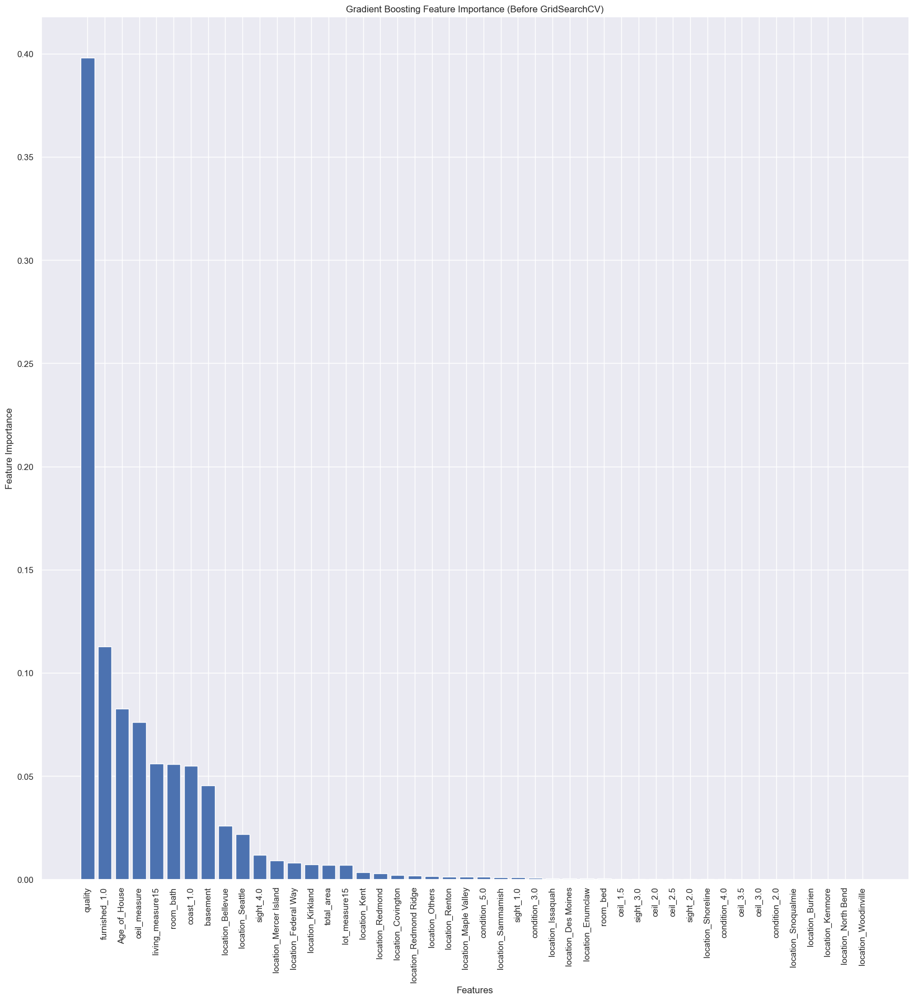

In [216]:
# Get the feature importance values
feature_importance_before = gbr.feature_importances_

# Sort feature importance values in descending order
sorted_indices_before = feature_importance_before.argsort()[::-1]
sorted_importance_before = feature_importance_before[sorted_indices_before]
sorted_features_before = X_train_gbr.columns[sorted_indices_before]

# Plot feature importance
plt.figure(figsize=(20,20))
plt.bar(range(len(sorted_importance_before)), sorted_importance_before, align='center')
plt.xticks(range(len(sorted_importance_before)), sorted_features_before, rotation=90)
plt.xlabel('Features')
plt.ylabel('Feature Importance')
plt.title('Gradient Boosting Feature Importance (Before GridSearchCV)')
plt.show()

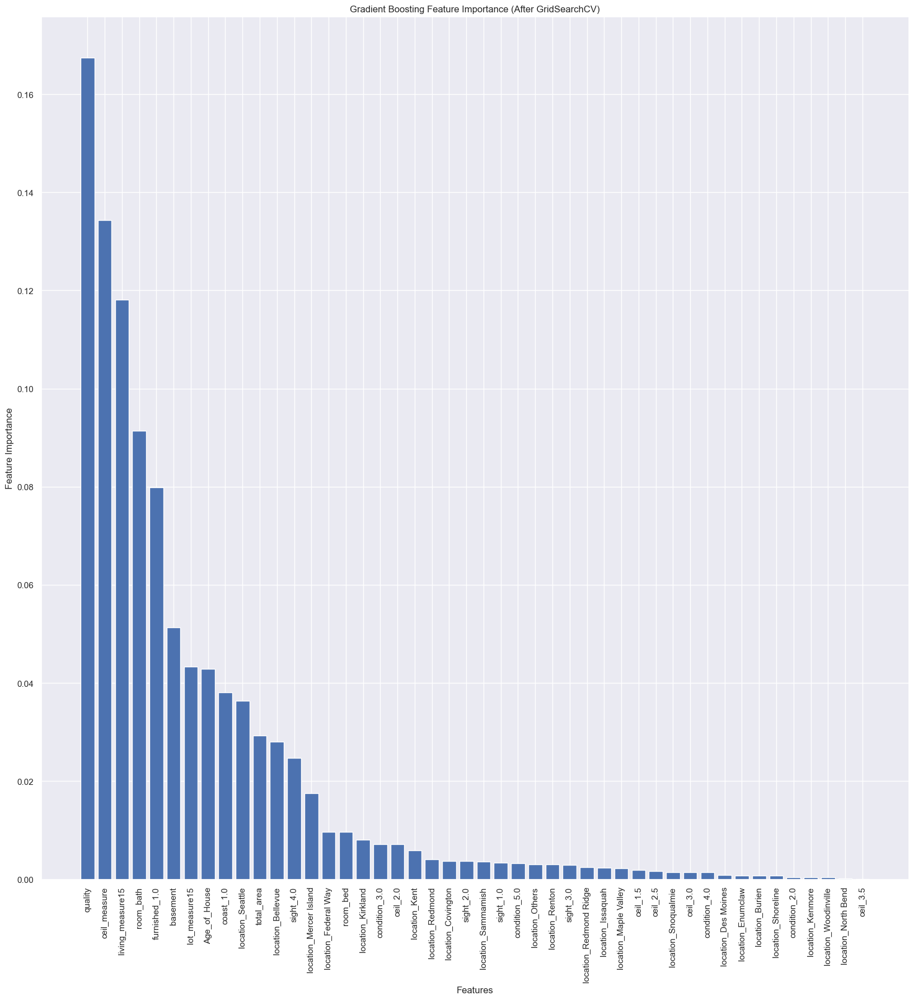

In [217]:
# Get the feature importance values
feature_importance_after = best_gb.feature_importances_

# Sort feature importance values in descending order
sorted_indices_after = feature_importance_after.argsort()[::-1]
sorted_importance_after = feature_importance_after[sorted_indices_after]
sorted_features_after = X_train_gbr.columns[sorted_indices_after]

# Plot feature importance
plt.figure(figsize=(20, 20))
plt.bar(range(len(sorted_importance_after)), sorted_importance_after, align='center')
plt.xticks(range(len(sorted_importance_after)), sorted_features_after, rotation=90)
plt.xlabel('Features')
plt.ylabel('Feature Importance')
plt.title('Gradient Boosting Feature Importance (After GridSearchCV)')
plt.show()

## AdaBoost Regression

In [183]:
# independent variables
X_abr = df_dummies.drop(["price"], axis=1)
# dependent variable
y_abr = df_dummies[["price"]]

In [184]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
import numpy as np

# Split the data into training and testing sets
X_train_abr, X_test_abr, y_train_abr, y_test_abr = train_test_split(X_abr, y_abr, test_size=0.3, random_state=1)

# Create the AdaBoost Regression model
abr = AdaBoostRegressor()

# Fit the model to the training data
abr.fit(X_train_abr, y_train_abr)

# Make predictions on the training and test data
train_predictions_abr = abr.predict(X_train_abr)
test_predictions_abr = abr.predict(X_test_abr)

# Evaluate the model
mse_train_abr = mean_squared_error(y_train_abr, train_predictions_abr)
mse_test_abr = mean_squared_error(y_test_abr, test_predictions_abr)
mae_train_abr = mean_absolute_error(y_train_abr, train_predictions_abr)
mae_test_abr = mean_absolute_error(y_test_abr, test_predictions_abr)
r2_train_abr = r2_score(y_train_abr, train_predictions_abr)
r2_test_abr = r2_score(y_test_abr, test_predictions_abr)

# Print the performance metrics
print("MSE - Train:", mse_train_abr)
print("MSE - Test:", mse_test_abr)
print("MAE - Train:", mae_train_abr)
print("MAE - Test:", mae_test_abr)
print("R^2 - Train:", r2_train_abr)
print("R^2 - Test:", r2_test_abr)

MSE - Train: 135043453336.5644
MSE - Test: 144959502238.00174
MAE - Train: 331893.7584528765
MAE - Test: 337444.23023930757
R^2 - Train: -0.04399679228150566
R^2 - Test: -0.00844063601870082


In [282]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_abr = mean_absolute_percentage_error(y_train_abr, train_predictions_abr)
test_mape_abr = mean_absolute_percentage_error(y_test_abr, test_predictions_abr)

print("MAPE - Train:", train_mape_abr)
print("MAPE - Test:", test_mape_abr)


MAPE - Train: 0.9199330025501682
MAPE - Test: 0.9258482106089141


In [186]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Create the AdaBoost Regression model
abr = AdaBoostRegressor()

# Define the parameter grid for grid search
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.1, 0.01, 0.001]
}

# Create the grid search object
grid_search = GridSearchCV(abr, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train_abr, y_train_abr)

# Get the best model from the grid search
best_abr = grid_search.best_estimator_

# Make predictions on the training and test data
train_predictions_grid_abr = best_abr.predict(X_train_abr)
test_predictions_grid_abr = best_abr.predict(X_test_abr)

# Evaluate the model
mse_train_grid_abr = mean_squared_error(y_train_abr, train_predictions_grid_abr)
mse_test_grid_abr = mean_squared_error(y_test_abr, test_predictions_grid_abr)
mae_train_grid_abr = mean_absolute_error(y_train_abr, train_predictions_grid_abr)
mae_test_grid_abr = mean_absolute_error(y_test_abr, test_predictions_grid_abr)
r2_train_grid_abr = r2_score(y_train_abr, train_predictions_grid_abr)
r2_test_grid_abr = r2_score(y_test_abr, test_predictions_grid_abr)

# Print the performance metrics
print("MSE - Train:", mse_train_grid_abr)
print("MSE - Test:", mse_test_grid_abr)
print("MAE - Train:", mae_train_grid_abr)
print("MAE - Test:", mae_test_grid_abr)
print("R^2 - Train:", r2_train_grid_abr)
print("R^2 - Test:", r2_test_grid_abr)

# Print the best parameters found by grid search
print("Best Parameters:", grid_search.best_params_)


MSE - Train: 49723158215.09798
MSE - Test: 62451564083.72278
MAE - Train: 159398.8590469147
MAE - Test: 168179.5161424253
R^2 - Train: 0.6155991542271031
R^2 - Test: 0.5655428307034989
Best Parameters: {'learning_rate': 0.1, 'n_estimators': 50}


In [283]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_grid_abr = mean_absolute_percentage_error(y_train_abr, train_predictions_grid_abr)
test_mape_grid_abr = mean_absolute_percentage_error(y_test_abr, test_predictions_grid_abr)

print("MAPE - Train:", train_mape_grid_abr)
print("MAPE - Test:", test_mape_grid_abr)

MAPE - Train: 0.3570912729147956
MAPE - Test: 0.3663873321727792


## Bagging Regression

In [187]:
# independent variables
X_bag = df_dummies.drop(["price"], axis=1)
# dependent variable
y_bag = df_dummies[["price"]]

In [188]:
from sklearn.ensemble import BaggingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Split the data into training and testing sets
X_train_bag, X_test_bag, y_train_bag, y_test_bag = train_test_split(X_bag, y_bag, test_size=0.3, random_state=1)

# Create the Bagging Regression model
bagging = BaggingRegressor()

# Fit the model to the training data
bagging.fit(X_train_bag, y_train_bag)

# Make predictions on the training and test data
train_predictions_bag = bagging.predict(X_train_bag)
test_predictions_bag = bagging.predict(X_test_bag)

# Evaluate the model
mse_train_bag = mean_squared_error(y_train_bag, train_predictions_bag)
mse_test_bag = mean_squared_error(y_test_bag, test_predictions_bag)
mae_train_bag = mean_absolute_error(y_train_bag, train_predictions_bag)
mae_test_bag = mean_absolute_error(y_test_bag, test_predictions_bag)
r2_train_bag = r2_score(y_train_bag, train_predictions_bag)
r2_test_bag = r2_score(y_test_bag, test_predictions_bag)

# Print the performance metrics
print("MSE - Train:", mse_train_bag)
print("MSE - Test:", mse_test_bag)
print("MAE - Train:", mae_train_bag)
print("MAE - Test:", mae_test_bag)
print("R^2 - Train:", r2_train_bag)
print("R^2 - Test:", r2_test_bag)


MSE - Train: 4963984721.835865
MSE - Test: 34362006479.0486
MAE - Train: 37355.58294578478
MAE - Test: 99371.60272632293
R^2 - Train: 0.9616243216647078
R^2 - Test: 0.7609536240562069


In [285]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_bag = mean_absolute_percentage_error(y_train_bag, train_predictions_bag)
test_mape_bag = mean_absolute_percentage_error(y_test_bag, test_predictions_bag)

print("MAPE - Train:", train_mape_bag)
print("MAPE - Test:", test_mape_bag)


MAPE - Train: 0.07137110851429126
MAPE - Test: 0.18649642024463317


In [190]:
from sklearn.ensemble import BaggingRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Create the Bagging Regression model
br = BaggingRegressor()

# Define the parameter grid for grid search
param_grid = {
    'n_estimators': [10, 50, 100],
    'max_samples': [0.5, 0.7, 0.9],
    'max_features': [0.5, 0.7, 0.9]
}

# Create the grid search object
grid_search = GridSearchCV(br, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train_bag, y_train_bag)

# Get the best model from the grid search
best_br = grid_search.best_estimator_

# Make predictions on the training and test data
train_predictions_grid_bag = best_br.predict(X_train_bag)
test_predictions_grid_bag = best_br.predict(X_test_bag)

# Evaluate the model
mse_train_grid_bag = mean_squared_error(y_train_bag, train_predictions_grid_bag)
mse_test_grid_bag = mean_squared_error(y_test_bag, test_predictions_grid_bag)
mae_train_grid_bag = mean_absolute_error(y_train_bag, train_predictions_grid_bag)
mae_test_grid_bag = mean_absolute_error(y_test_bag, test_predictions_grid_bag)
r2_train_grid_bag = r2_score(y_train_bag, train_predictions_grid_bag)
r2_test_grid_bag = r2_score(y_test_bag, test_predictions_grid_bag)

# Print the performance metrics
print("MSE - Train:", mse_train_grid_bag)
print("MSE - Test:", mse_test_grid_bag)
print("MAE - Train:", mae_train_grid_bag)
print("MAE - Test:", mae_test_grid_bag)
print("R^2 - Train:", r2_train_grid_bag)
print("R^2 - Test:", r2_test_grid_bag)

# Print the best parameters found by grid search
print("Best Parameters:", grid_search.best_params_)


MSE - Train: 6303683234.845534
MSE - Test: 31255460951.020256
MAE - Train: 44949.129650465766
MAE - Test: 94922.08687552332
R^2 - Train: 0.9512673519956886
R^2 - Test: 0.782564947906936
Best Parameters: {'max_features': 0.9, 'max_samples': 0.7, 'n_estimators': 100}


In [286]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_grid_bag = mean_absolute_percentage_error(y_train_bag, train_predictions_grid_bag)
test_mape_grid_bag = mean_absolute_percentage_error(y_test_bag, test_predictions_grid_bag)

print("MAPE - Train:", train_mape_grid_bag)
print("MAPE - Test:", test_mape_grid_bag)

MAPE - Train: 0.08754153646210874
MAPE - Test: 0.18147408043331123


## Voting regression

In [191]:
# independent variables
X_vote = df_dummies.drop(["price"], axis=1)
# dependent variable
y_vote = df_dummies[["price"]]

In [192]:
from sklearn.ensemble import VotingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Split the data into training and testing sets
X_train_vote, X_test_vote, y_train_vote, y_test_vote = train_test_split(X_vote, y_vote, test_size=0.3, random_state=1)

# Create the individual regression models
model1 = LinearRegression()
model2 = DecisionTreeRegressor()
model3 = KNeighborsRegressor()

# Create the Voting Regression model
voting = VotingRegressor([('lr', model1), ('dt', model2), ('knn', model3)])

# Fit the model to the training data
voting.fit(X_train_vote, y_train_vote)

# Make predictions on the training and test data
train_predictions_vote = voting.predict(X_train_vote)
test_predictions_vote = voting.predict(X_test_vote)

# Evaluate the model
mse_train_vote = mean_squared_error(y_train_vote, train_predictions_vote)
mse_test_vote = mean_squared_error(y_test_vote, test_predictions_vote)
mae_train_vote = mean_absolute_error(y_train_vote, train_predictions_vote)
mae_test_vote = mean_absolute_error(y_test_vote, test_predictions_vote)
r2_train_vote = r2_score(y_train_vote, train_predictions_vote)
r2_test_vote = r2_score(y_test_vote, test_predictions_vote)

# Print the performance metrics
print("MSE - Train:", mse_train_vote)
print("MSE - Test:", mse_test_vote)
print("MAE - Train:", mae_train_vote)
print("MAE - Test:", mae_test_vote)
print("R^2 - Train:", r2_train_vote)
print("R^2 - Test:", r2_test_vote)


MSE - Train: 13814560134.2508
MSE - Test: 38965968616.731064
MAE - Train: 68908.81624908028
MAE - Test: 109369.78790436308
R^2 - Train: 0.8932021056141579
R^2 - Test: 0.728925213123147


In [287]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_vote = mean_absolute_percentage_error(y_train_vote, train_predictions_vote)
test_mape_vote = mean_absolute_percentage_error(y_test_vote, test_predictions_vote)

print("MAPE - Train:", train_mape_vote)
print("MAPE - Test:", test_mape_vote)


MAPE - Train: 0.13423819638820964
MAPE - Test: 0.20931484440510273


In [215]:
from sklearn.ensemble import VotingRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Create the individual regression models
model1 = LinearRegression()
model2 = DecisionTreeRegressor()
model3 = SVR()

# Create the Voting Regression model
vr = VotingRegressor([('lr', model1), ('dt', model2), ('svr', model3)])

# Define the parameter grid for grid search
param_grid = {
    'weights': [[1, 1, 1], [2, 1, 1], [1, 2, 1], [1, 1, 2]]
}

# Create the grid search object
grid_search = GridSearchCV(vr, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train_vote, y_train_vote)

# Get the best model from the grid search
best_vr = grid_search.best_estimator_

# Make predictions on the training and test data
train_predictions_grid_vote = best_vr.predict(X_train_vote)
test_predictions_grid_vote = best_vr.predict(X_test_vote)

# Evaluate the model
mse_train_grid_vote = mean_squared_error(y_train_vote, train_predictions_grid_vote)
mse_test_grid_vote = mean_squared_error(y_test_vote, test_predictions_grid_vote)
mae_train_grid_vote = mean_absolute_error(y_train_vote, train_predictions_grid_vote)
mae_test_grid_vote = mean_absolute_error(y_test_vote, test_predictions_grid_vote)
r2_train_grid_vote = r2_score(y_train_vote, train_predictions_grid_vote)
r2_test_grid_vote = r2_score(y_test_vote, test_predictions_grid_vote)

# Print the performance metrics
print("MSE - Train:", mse_train_grid_vote)
print("MSE - Test:", mse_test_grid_vote)
print("MAE - Train:", mae_train_grid_vote)
print("MAE - Test:", mae_test_grid_vote)
print("R^2 - Train:", r2_train_grid_vote)
print("R^2 - Test:", r2_test_grid_vote)

# Print the best parameters found by grid search
print("Best Parameters:", grid_search.best_params_)


MSE - Train: 25665060626.838867
MSE - Test: 44617830432.60593
MAE - Train: 85252.27134195223
MAE - Test: 109227.82794335902
R^2 - Train: 0.8015880051485966
R^2 - Test: 0.689606872232787
Best Parameters: {'weights': [2, 1, 1]}


In [288]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_grid_vote = mean_absolute_percentage_error(y_train_vote, train_predictions_grid_vote)
test_mape_grid_vote = mean_absolute_percentage_error(y_test_vote, test_predictions_grid_vote)

print("MAPE - Train:", train_mape_grid_vote)
print("MAPE - Test:", test_mape_grid_vote)

MAPE - Train: 0.1603415367582059
MAPE - Test: 0.20490959656966912


## Support vector regression

In [195]:
# independent variables
X_svr = df_dummies.drop(["price"], axis=1)
# dependent variable
y_svr = df_dummies[["price"]]

In [196]:
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Split the data into training and testing sets
X_train_svr, X_test_svr, y_train_svr, y_test_svr = train_test_split(X_svr, y_svr, test_size=0.3, random_state=1)

# Create the SVR model
svr = SVR()

# Fit the model to the training data
svr.fit(X_train_svr, y_train_svr)

# Make predictions on the training and test data
train_predictions_svr = svr.predict(X_train_svr)
test_predictions_svr = svr.predict(X_test_svr)

# Evaluate the model
mse_train_svr = mean_squared_error(y_train_svr, train_predictions_svr)
mse_test_svr = mean_squared_error(y_test_svr, test_predictions_svr)
mae_train_svr = mean_absolute_error(y_train_svr, train_predictions_svr)
mae_test_svr = mean_absolute_error(y_test_svr, test_predictions_svr)
r2_train_svr = r2_score(y_train_svr, train_predictions_svr)
r2_test_svr = r2_score(y_test_svr, test_predictions_svr)

# Print the performance metrics
print("MSE - Train:", mse_train_svr)
print("MSE - Test:", mse_test_svr)
print("MAE - Train:", mae_train_svr)
print("MAE - Test:", mae_test_svr)
print("R^2 - Train:", r2_train_svr)
print("R^2 - Test:", r2_test_svr)


MSE - Train: 137208176497.6482
MSE - Test: 152357248471.71136
MAE - Train: 220320.1629086032
MAE - Test: 225019.47503899503
R^2 - Train: -0.06073187999224805
R^2 - Test: -0.059904581478299246


In [289]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_svr = mean_absolute_percentage_error(y_train_svr, train_predictions_svr)
test_mape_svr = mean_absolute_percentage_error(y_test_svr, test_predictions_svr)

print("MAPE - Train:", train_mape_svr)
print("MAPE - Test:", test_mape_svr)

MAPE - Train: 0.42339898198407533
MAPE - Test: 0.4278025553840294


In [197]:
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV

# Create the SVR model
svr = SVR()

# Define the parameter grid for grid search
param_grid = {
    'kernel': ['linear', 'rbf'],
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto']
}

# Create the grid search object
grid_search = GridSearchCV(svr, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search to the training data
grid_search.fit(X_train_svr, y_train_svr)

# Get the best model from the grid search
best_svr = grid_search.best_estimator_

# Make predictions on the training and test data
train_predictions_grid_svr = best_svr.predict(X_train_svr)
test_predictions_grid_svr = best_svr.predict(X_test_svr)

# Evaluate the model
mse_train_grid_svr = mean_squared_error(y_train_svr, train_predictions_grid_svr)
mse_test_grid_svr = mean_squared_error(y_test_svr, test_predictions_grid_svr)
mae_train_grid_svr = mean_absolute_error(y_train_svr, train_predictions_grid_svr)
mae_test_grid_svr = mean_absolute_error(y_test_svr, test_predictions_grid_svr)
r2_train_grid_svr = r2_score(y_train_svr, train_predictions_grid_svr)
r2_test_grid_svr = r2_score(y_test_svr, test_predictions_grid_svr)

# Print the performance metrics
print("MSE - Train:", mse_train_grid_svr)
print("MSE - Test:", mse_test_grid_svr)
print("MAE - Train:", mae_train_grid_svr)
print("MAE - Test:", mae_test_grid_svr)
print("R^2 - Train:", r2_train_grid_svr)
print("R^2 - Test:", r2_test_grid_svr)

# Print the best parameters found by grid search
print("Best Parameters:", grid_search.best_params_)


MSE - Train: 58403553872.232086
MSE - Test: 67565020970.94664
MAE - Train: 144232.2916981053
MAE - Test: 148614.29283339877
R^2 - Train: 0.5484925674368747
R^2 - Test: 0.5299700145997306
Best Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'linear'}


In [290]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_grid_svr = mean_absolute_percentage_error(y_train_svr, train_predictions_grid_svr)
test_mape_grid_svr = mean_absolute_percentage_error(y_test_svr, test_predictions_grid_svr)

print("MAPE - Train:", train_mape_grid_svr)
print("MAPE - Test:", test_mape_grid_svr)

MAPE - Train: 0.286079607673475
MAPE - Test: 0.2887574821113627


## XGB Regression

In [198]:
pip install xgboost


     ---------------------------------------- 70.9/70.9 MB 3.4 MB/s eta 0:00:00


In [199]:
# independent variables
X_xgb = df_dummies.drop(["price"], axis=1)
# dependent variable
y_xgb = df_dummies[["price"]]

In [200]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Split the data into training and testing sets
X_train_xgb, X_test_xgb, y_train_xgb, y_test_xgb = train_test_split(X_xgb, y_xgb, test_size=0.3, random_state=1)

# Create the XGBoost Regression model
xgb_reg = xgb.XGBRegressor()

# Fit the model to the training data
xgb_reg.fit(X_train_xgb, y_train_xgb)

# Make predictions on the training and test data
train_predictions_xgb = xgb_reg.predict(X_train_xgb)
test_predictions_xgb = xgb_reg.predict(X_test_xgb)

# Evaluate the model
mse_train_xgb = mean_squared_error(y_train_xgb, train_predictions_xgb)
mse_test_xgb = mean_squared_error(y_test_xgb, test_predictions_xgb)
mae_train_xgb = mean_absolute_error(y_train_xgb, train_predictions_xgb)
mae_test_xgb = mean_absolute_error(y_test_xgb, test_predictions_xgb)
r2_train_xgb = r2_score(y_train_xgb, train_predictions_xgb)
r2_test_xgb = r2_score(y_test_xgb, test_predictions_xgb)

# Print the performance metrics
print("MSE - Train:", mse_train_xgb)
print("MSE - Test:", mse_test_xgb)
print("MAE - Train:", mae_train_xgb)
print("MAE - Test:", mae_test_xgb)
print("R^2 - Train:", r2_train_xgb)
print("R^2 - Test:", r2_test_xgb)

MSE - Train: 6831838902.581139
MSE - Test: 28655118993.016357
MAE - Train: 57824.07445439507
MAE - Test: 93472.59954968853
R^2 - Train: 0.9471842749614614
R^2 - Test: 0.8006547623551821


In [291]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_xgb = mean_absolute_percentage_error(y_train_xgb, train_predictions_xgb)
test_mape_xgb = mean_absolute_percentage_error(y_test_xgb, test_predictions_xgb)

print("MAPE - Train:", train_mape_xgb)
print("MAPE - Test:", test_mape_xgb)

MAPE - Train: 0.12883247103414985
MAPE - Test: 0.1788878636918672


In [202]:
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Create the XGBoost Regression model
xgb = XGBRegressor()

# Define the parameter grid for grid search
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]
}

# Create the grid search object
grid_search = GridSearchCV(xgb, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train_xgb, y_train_xgb)

# Get the best model from the grid search
best_xgb = grid_search.best_estimator_

# Make predictions on the training and test data
train_predictions_grid_xgb = best_xgb.predict(X_train_xgb)
test_predictions_grid_xgb = best_xgb.predict(X_test_xgb)

# Evaluate the model
mse_train_grid_xgb = mean_squared_error(y_train_xgb, train_predictions_grid_xgb)
mse_test_grid_xgb = mean_squared_error(y_test_xgb, test_predictions_grid_xgb)
mae_train_grid_xgb = mean_absolute_error(y_train_xgb, train_predictions_grid_xgb)
mae_test_grid_xgb = mean_absolute_error(y_test_xgb, test_predictions_grid_xgb)
r2_train_grid_xgb = r2_score(y_train_xgb, train_predictions_grid_xgb)
r2_test_grid_xgb = r2_score(y_test_xgb, test_predictions_grid_xgb)

# Print the performance metrics
print("MSE - Train:", mse_train_grid_xgb)
print("MSE - Test:", mse_test_grid_xgb)
print("MAE - Train:", mae_train_grid_xgb)
print("MAE - Test:", mae_test_grid_xgb)
print("R^2 - Train:", r2_train_grid_xgb)
print("R^2 - Test:", r2_test_grid_xgb)

# Print the best parameters found by grid search
print("Best Parameters:", grid_search.best_params_)


MSE - Train: 12796350641.035112
MSE - Test: 27635648960.597317
MAE - Train: 76139.16272210467
MAE - Test: 94634.65640304223
R^2 - Train: 0.9010737011526581
R^2 - Test: 0.8077469156257329
Best Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 300}


In [292]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_grid_xgb = mean_absolute_percentage_error(y_train_xgb, train_predictions_grid_xgb)
test_mape_grid_xgb = mean_absolute_percentage_error(y_test_xgb, test_predictions_grid_xgb)

print("MAPE - Train:", train_mape_grid_xgb)
print("MAPE - Test:", test_mape_grid_xgb)

MAPE - Train: 0.16011085729375604
MAPE - Test: 0.18373962766573163


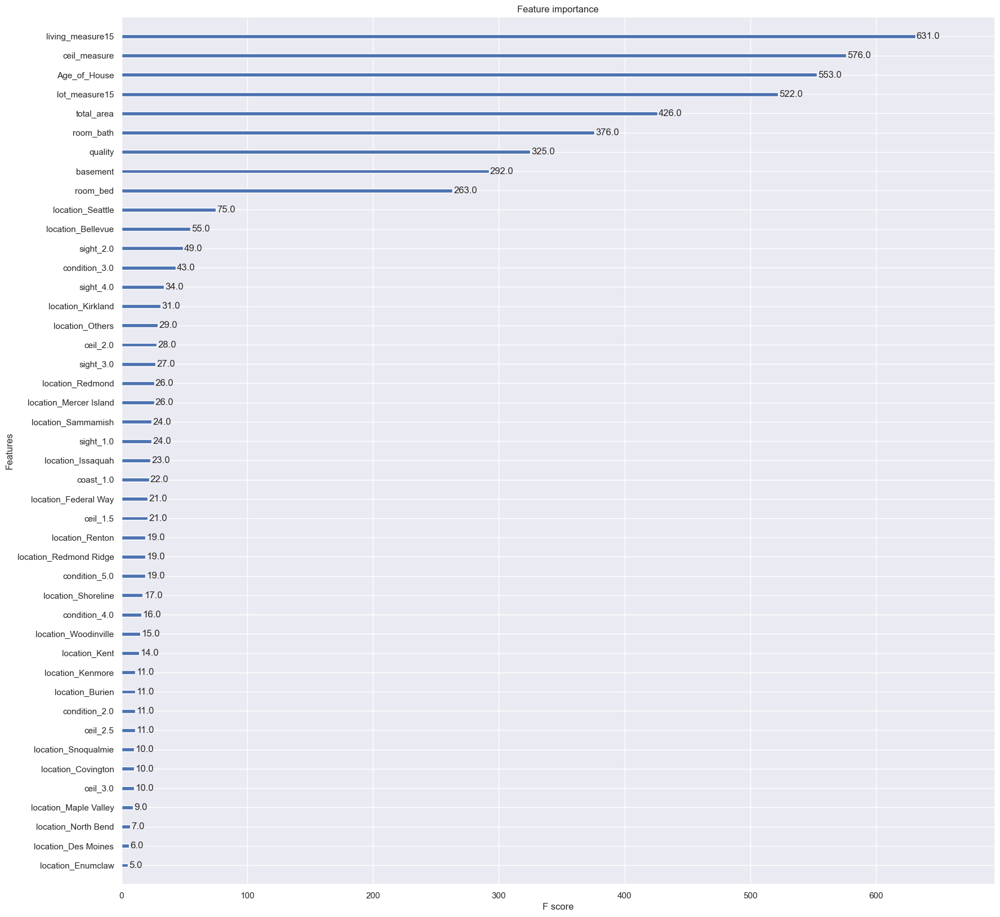

In [218]:
import xgboost as xgb
from xgboost import plot_importance
import matplotlib.pyplot as plt

# Create and fit the XGBoost regression model
xgb_model = xgb.XGBRegressor()
xgb_model.fit(X_train_xgb, y_train_xgb)

# Plot feature importance
fig, ax = plt.subplots(figsize=(20, 20))
plot_importance(xgb_model, ax=ax)
plt.show()

In [219]:
# Access feature importance
feature_importance = best_xgb.feature_importances_

# Print feature importance
for feature, importance in zip(X_train_xgb.columns, feature_importance):
    print(f"{feature}: {importance}")

room_bed: 0.002485844772309065
room_bath: 0.0396784208714962
quality: 0.21853318810462952
ceil_measure: 0.02835170179605484
basement: 0.02777898870408535
living_measure15: 0.02450479008257389
lot_measure15: 0.008110945113003254
total_area: 0.004966255277395248
Age_of_House: 0.03546232730150223
ceil_1.5: 0.0010660251136869192
ceil_2.0: 0.006042282097041607
ceil_2.5: 0.001872377935796976
ceil_3.0: 0.002737942850217223
ceil_3.5: 0.0
coast_1.0: 0.13291683793067932
sight_1.0: 0.01256779208779335
sight_2.0: 0.0021625312510877848
sight_3.0: 0.004047575872391462
sight_4.0: 0.04925166070461273
condition_2.0: 0.0025660705287009478
condition_3.0: 0.010349778458476067
condition_4.0: 0.002449184888973832
condition_5.0: 0.01677083596587181
furnished_1.0: 0.0
location_Bellevue: 0.05471985787153244
location_Burien: 0.005255447700619698
location_Covington: 0.029657766222953796
location_Des Moines: 0.013123656623065472
location_Enumclaw: 0.009661871939897537
location_Federal Way: 0.03530396148562431
loc

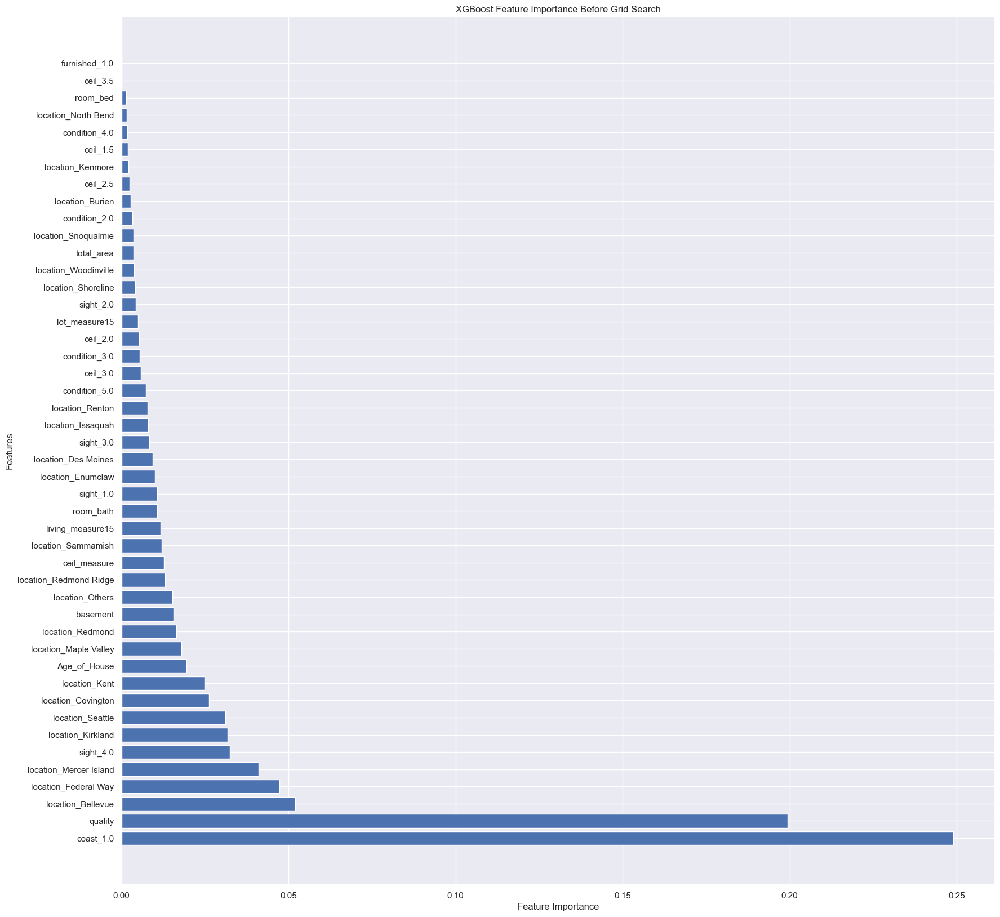

In [220]:
# Get the feature importance values
feature_importance = xgb_reg.feature_importances_

# Sort feature importance values in descending order
sorted_indices = feature_importance.argsort()[::-1]
sorted_importance = feature_importance[sorted_indices]
sorted_features = X_train_xgb.columns[sorted_indices]

# Plot feature importance
plt.figure(figsize=(20, 20))
plt.barh(range(len(sorted_importance)), sorted_importance, align='center')
plt.yticks(range(len(sorted_importance)), sorted_features)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('XGBoost Feature Importance Before Grid Search')
plt.show()

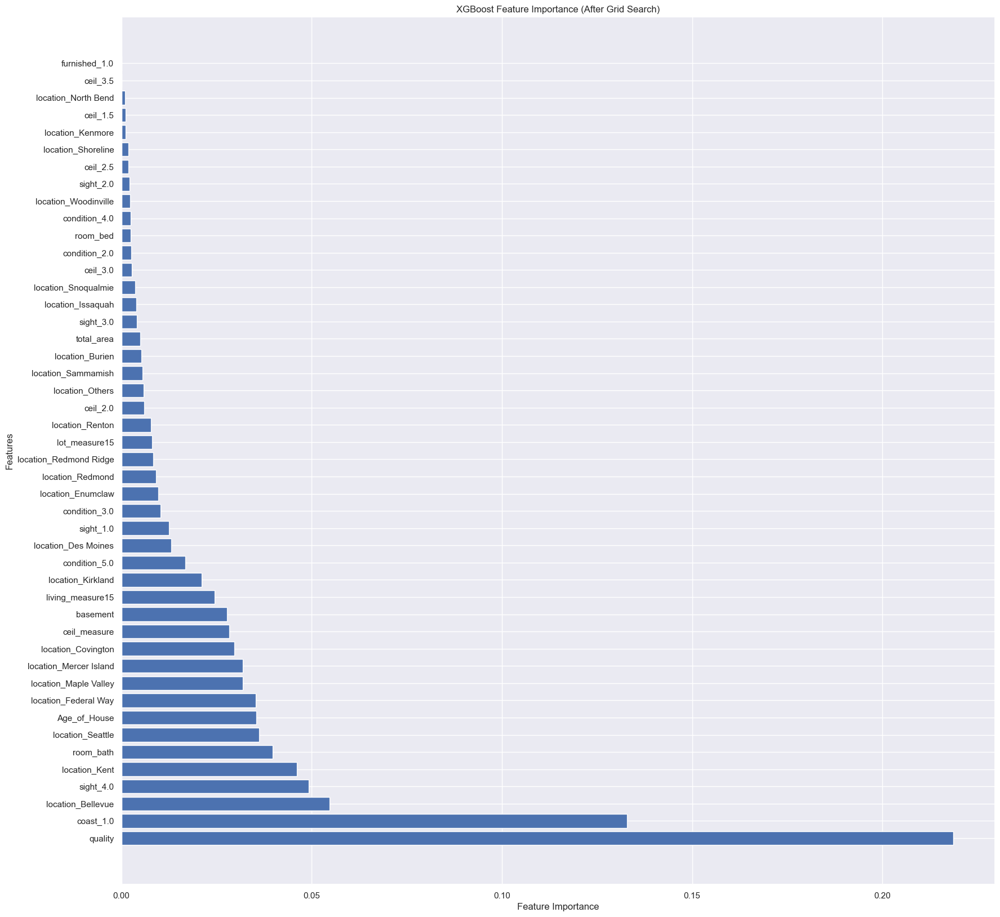

In [222]:
# Get feature importance
feature_importance = best_xgb.feature_importances_

# Sort feature importance values in descending order
sorted_indices = feature_importance.argsort()[::-1]
sorted_importance = feature_importance[sorted_indices]
sorted_features = X_train_xgb.columns[sorted_indices]

# Plot feature importance
plt.figure(figsize=(20, 20))
plt.barh(range(len(sorted_importance)), sorted_importance, align='center')
plt.yticks(range(len(sorted_importance)), sorted_features)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('XGBoost Feature Importance (After Grid Search)')
plt.show()

## KNN Regression

In [203]:
# independent variables
X_knn = df_dummies.drop(["price"], axis=1)
# dependent variable
y_knn = df_dummies[["price"]]

In [204]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Split the data into training and testing sets
X_train_knn, X_test_knn, y_train_knn, y_test_knn = train_test_split(X_knn, y_knn, test_size=0.3, random_state=1)

# Create the KNN regression model
knn = KNeighborsRegressor(n_neighbors=5)

# Fit the model to the training data
knn.fit(X_train_knn, y_train_knn)

# Make predictions on the training and test data
train_predictions_knn = knn.predict(X_train_knn)
test_predictions_knn = knn.predict(X_test_knn)

# Evaluate the model
mse_train_knn = mean_squared_error(y_train_knn, train_predictions_knn)
mse_test_knn = mean_squared_error(y_test_knn, test_predictions_knn)
mae_train_knn = mean_absolute_error(y_train_knn, train_predictions_knn)
mae_test_knn = mean_absolute_error(y_test_knn, test_predictions_knn)
r2_train_knn = r2_score(y_train_knn, train_predictions_knn)
r2_test_knn = r2_score(y_test_knn, test_predictions_knn)

# Print the performance metrics
print("MSE - Train:", mse_train_knn)
print("MSE - Test:", mse_test_knn)
print("MAE - Train:", mae_train_knn)
print("MAE - Test:", mae_test_knn)
print("R^2 - Train:", r2_train_knn)
print("R^2 - Test:", r2_test_knn)


MSE - Train: 44776001455.392914
MSE - Test: 76442076050.47911
MAE - Train: 130658.31722423754
MAE - Test: 163523.0256699577
R^2 - Train: 0.6538447385959637
R^2 - Test: 0.4682149524467234


In [293]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_knn = mean_absolute_percentage_error(y_train_knn, train_predictions_knn)
test_mape_knn = mean_absolute_percentage_error(y_test_knn, test_predictions_knn)

print("MAPE - Train:", train_mape_knn)
print("MAPE - Test:", test_mape_knn)

MAPE - Train: 0.2597183587582929
MAPE - Test: 0.3242743937267567


In [206]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV

# Create the KNN regressor
knn = KNeighborsRegressor()

# Define the parameter grid for grid search
param_grid = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}

# Create the grid search object
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search to the training data
grid_search.fit(X_train_knn, y_train_knn)

# Get the best model from the grid search
best_knn = grid_search.best_estimator_

# Make predictions on the training and test data
train_predictions_grid_knn = best_knn.predict(X_train_knn)
test_predictions_grid_knn = best_knn.predict(X_test_knn)

# Evaluate the model
mse_train_grid_knn = mean_squared_error(y_train_knn, train_predictions_grid_knn)
mse_test_grid_knn = mean_squared_error(y_test_knn, test_predictions_grid_knn)
mae_train_grid_knn = mean_absolute_error(y_train_knn, train_predictions_grid_knn)
mae_test_grid_knn = mean_absolute_error(y_test_knn, test_predictions_grid_knn)
r2_train_grid_knn = r2_score(y_train_knn, train_predictions_grid_knn)
r2_test_grid_knn = r2_score(y_test_knn, test_predictions_grid_knn)

# Print the performance metrics
print("MSE - Train:", mse_train_grid_knn)
print("MSE - Test:", mse_test_grid_knn)
print("MAE - Train:", mae_train_grid_knn)
print("MAE - Test:", mae_test_grid_knn)
print("R^2 - Train:", r2_train_grid_knn)
print("R^2 - Test:", r2_test_grid_knn)

# Print the best parameters found by grid search
print("Best Parameters:", grid_search.best_params_)


MSE - Train: 8506076.959828027
MSE - Test: 73734281878.87148
MAE - Train: 120.47239016525594
MAE - Test: 156862.0810912254
R^2 - Train: 0.9999342410398908
R^2 - Test: 0.48705228035186776
Best Parameters: {'n_neighbors': 7, 'p': 1, 'weights': 'distance'}


In [294]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_grid_knn = mean_absolute_percentage_error(y_train_knn, train_predictions_grid_knn)
test_mape_grid_knn = mean_absolute_percentage_error(y_test_knn, test_predictions_grid_knn)

print("MAPE - Train:", train_mape_grid_knn)
print("MAPE - Test:", test_mape_grid_knn)

MAPE - Train: 0.000473752145117398
MAPE - Test: 0.30657824172832276


## Lasso Regression

In [207]:
# independent variables
X_lss = df_dummies.drop(["price"], axis=1)
# dependent variable
y_lss = df_dummies[["price"]]

In [208]:
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Split the data into training and testing sets
X_train_lss, X_test_lss, y_train_lss, y_test_lss = train_test_split(X_lss, y_lss, test_size=0.3, random_state=1)


# Create the Lasso regression model
lasso = Lasso(alpha=0.1)

# Fit the model to the training data
lasso.fit(X_train_lss, y_train_lss)

# Make predictions on the training and test data
train_predictions_lss = lasso.predict(X_train_lss)
test_predictions_lss = lasso.predict(X_test_lss)

# Evaluate the model
mse_train_lss = mean_squared_error(y_train_lss, train_predictions_lss)
mse_test_lss = mean_squared_error(y_test_lss, test_predictions_lss)
mae_train_lss = mean_absolute_error(y_train_lss, train_predictions_lss)
mae_test_lss = mean_absolute_error(y_test_lss, test_predictions_lss)
r2_train_lss = r2_score(y_train_lss, train_predictions_lss)
r2_test_lss = r2_score(y_test_lss, test_predictions_lss)

# Print the performance metrics
print("MSE - Train:", mse_train_lss)
print("MSE - Test:", mse_test_lss)
print("MAE - Train:", mae_train_lss)
print("MAE - Test:", mae_test_lss)
print("R^2 - Train:", r2_train_lss)
print("R^2 - Test:", r2_test_lss)


MSE - Train: 34171321338.643566
MSE - Test: 40935456340.177444
MAE - Train: 115876.26899556462
MAE - Test: 120499.82641509721
R^2 - Train: 0.7358276244857762
R^2 - Test: 0.7152240661007021


In [295]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_lss = mean_absolute_percentage_error(y_train_lss, train_predictions_lss)
test_mape_lss = mean_absolute_percentage_error(y_test_lss, test_predictions_lss)

print("MAPE - Train:", train_mape_lss)
print("MAPE - Test:", test_mape_lss)

MAPE - Train: 0.24113213279511594
MAPE - Test: 0.24585247866813348


In [210]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

# Create the Lasso regressor
lasso = Lasso()

# Define the parameter grid for grid search
param_grid = {
    'alpha': [0.1, 1.0, 10.0],
    'fit_intercept': [True, False],
    'normalize': [True, False]
}

# Create the grid search object
grid_search = GridSearchCV(lasso, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search to the training data
grid_search.fit(X_train_lss, y_train_lss)

# Get the best model from the grid search
best_lasso = grid_search.best_estimator_

# Make predictions on the training and test data
train_predictions_grid_lss = best_lasso.predict(X_train_lss)
test_predictions_grid_lss = best_lasso.predict(X_test_lss)

# Evaluate the model
mse_train_grid_lss = mean_squared_error(y_train_lss, train_predictions_grid_lss)
mse_test_grid_lss = mean_squared_error(y_test_lss, test_predictions_grid_lss)
mae_train_grid_lss = mean_absolute_error(y_train_lss, train_predictions_grid_lss)
mae_test_grid_lss = mean_absolute_error(y_test_lss, test_predictions_grid_lss)
r2_train_grid_lss = r2_score(y_train_lss, train_predictions_grid_lss)
r2_test_grid_lss = r2_score(y_test_lss, test_predictions_grid_lss)

# Print the performance metrics
print("MSE - Train:", mse_train_grid_lss)
print("MSE - Test:", mse_test_grid_lss)
print("MAE - Train:", mae_train_grid_lss)
print("MAE - Test:", mae_test_grid_lss)
print("R^2 - Train:", r2_train_grid_lss)
print("R^2 - Test:", r2_test_grid_lss)

# Print the best parameters found by grid search
print("Best Parameters:", grid_search.best_params_)


MSE - Train: 34178232698.759995
MSE - Test: 40966601463.3318
MAE - Train: 115848.85104276855
MAE - Test: 120509.62386209972
R^2 - Train: 0.7357741939964517
R^2 - Test: 0.7150073986362189
Best Parameters: {'alpha': 1.0, 'fit_intercept': True, 'normalize': True}


In [296]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_grid_lss = mean_absolute_percentage_error(y_train_lss, train_predictions_grid_lss)
test_mape_grid_lss = mean_absolute_percentage_error(y_test_lss, test_predictions_grid_lss)

print("MAPE - Train:", train_mape_grid_lss)
print("MAPE - Test:", test_mape_grid_lss)

MAPE - Train: 0.24097384065347086
MAPE - Test: 0.24582522799631049


## Ridge Regression

In [211]:
# independent variables
X_rdg = df_dummies.drop(["price"], axis=1)
# dependent variable
y_rdg = df_dummies[["price"]]

In [212]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Split the data into training and testing sets
X_train_rdg, X_test_rdg, y_train_rdg, y_test_rdg = train_test_split(X_rdg, y_rdg, test_size=0.3, random_state=1)

# Create the Ridge Regression model
ridge = Ridge(alpha=1.0)

# Fit the model to the training data
ridge.fit(X_train_rdg, y_train_rdg)

# Make predictions on the training and test data
train_predictions_rdg = ridge.predict(X_train_rdg)
test_predictions_rdg = ridge.predict(X_test_rdg)

# Evaluate the model
mse_train_rdg = mean_squared_error(y_train_rdg, train_predictions_rdg)
mse_test_rdg = mean_squared_error(y_test_rdg, test_predictions_rdg)
mae_train_rdg = mean_absolute_error(y_train_rdg, train_predictions_rdg)
mae_test_rdg = mean_absolute_error(y_test_rdg, test_predictions_rdg)
r2_train_rdg = r2_score(y_train_rdg, train_predictions_rdg)
r2_test_rdg = r2_score(y_test_rdg, test_predictions_rdg)

# Print the performance metrics
print("MSE - Train:", mse_train_rdg)
print("MSE - Test:", mse_test_rdg)
print("MAE - Train:", mae_train_rdg)
print("MAE - Test:", mae_test_rdg)
print("R^2 - Train:", r2_train_rdg)
print("R^2 - Test:", r2_test_rdg)


MSE - Train: 34172888715.540146
MSE - Test: 40945399579.77864
MAE - Train: 115887.29873111095
MAE - Test: 120532.55194339695
R^2 - Train: 0.7358155073752322
R^2 - Test: 0.7151548939063119


In [297]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_rdg = mean_absolute_percentage_error(y_train_rdg, train_predictions_rdg)
test_mape_rdg = mean_absolute_percentage_error(y_test_rdg, test_predictions_rdg)

print("MAPE - Train:", train_mape_rdg)
print("MAPE - Test:", test_mape_rdg)

MAPE - Train: 0.2411110379982691
MAPE - Test: 0.24587188766266938


In [214]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

# Create the Ridge regressor
ridge = Ridge()

# Define the parameter grid for grid search
param_grid = {
    'alpha': [0.1, 1.0, 10.0],
    'fit_intercept': [True, False],
    'normalize': [True, False],
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
}

# Create the grid search object
grid_search = GridSearchCV(ridge, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search to the training data
grid_search.fit(X_train_rdg, y_train_rdg)

# Get the best model from the grid search
best_ridge = grid_search.best_estimator_

# Make predictions on the training and test data
train_predictions_grid_rdg = best_ridge.predict(X_train_rdg)
test_predictions_grid_rdg = best_ridge.predict(X_test_rdg)

# Evaluate the model
mse_train_grid_rdg = mean_squared_error(y_train_rdg, train_predictions_grid_rdg)
mse_test_grid_rdg = mean_squared_error(y_test_rdg, test_predictions_grid_rdg)
mae_train_grid_rdg = mean_absolute_error(y_train_rdg, train_predictions_grid_rdg)
mae_test_grid_rdg = mean_absolute_error(y_test_rdg, test_predictions_grid_rdg)
r2_train_grid_rdg = r2_score(y_train_rdg, train_predictions_grid_rdg)
r2_test_grid_rdg = r2_score(y_test_rdg, test_predictions_grid_rdg)

# Print the performance metrics
print("MSE - Train:", mse_train_grid_rdg)
print("MSE - Test:", mse_test_grid_rdg)
print("MAE - Train:", mae_train_grid_rdg)
print("MAE - Test:", mae_test_grid_rdg)
print("R^2 - Train:", r2_train_grid_rdg)
print("R^2 - Test:", r2_test_grid_rdg)

# Print the best parameters found by grid search
print("Best Parameters:", grid_search.best_params_)


MSE - Train: 34172888715.540146
MSE - Test: 40945399579.77864
MAE - Train: 115887.29873111095
MAE - Test: 120532.55194339695
R^2 - Train: 0.7358155073752322
R^2 - Test: 0.7151548939063119
Best Parameters: {'alpha': 1.0, 'fit_intercept': True, 'normalize': False, 'solver': 'auto'}


In [298]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_grid_rdg = mean_absolute_percentage_error(y_train_rdg, train_predictions_grid_rdg)
test_mape_grid_rdg = mean_absolute_percentage_error(y_test_rdg, test_predictions_grid_rdg)

print("MAPE - Train:", train_mape_grid_rdg)
print("MAPE - Test:", test_mape_grid_rdg)

MAPE - Train: 0.2411110379982691
MAPE - Test: 0.24587188766266938


## Stacking Regression

In [224]:
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# independent variables
X_sr = df_dummies.drop(["price"], axis=1)
# dependent variable
y_sr = df_dummies[["price"]]

# Split the dataset into training and testing sets
X_train_sr, X_test_sr, y_train_sr, y_test_sr = train_test_split(X_sr, y_sr, test_size=0.3, random_state=1)

# Define the base regression models
base_models = [
    ('lr', LinearRegression()),
    ('gbr', GradientBoostingRegressor(random_state=1)),
    ('xgb', XGBRegressor(random_state=1))
]

# Define the meta regression model
meta_model = LinearRegression()

# Create the stacking regression model
stacking_reg = StackingRegressor(estimators=base_models, final_estimator=meta_model)

# Fit the stacking model to the training data
stacking_reg.fit(X_train_sr, y_train_sr)

# Make predictions on the training and testing data
y_train_pred_sr = stacking_reg.predict(X_train_sr)
y_test_pred_sr = stacking_reg.predict(X_test_sr)

# Calculate the mean squared error for training and testing data
mse_train_sr = mean_squared_error(y_train_sr, y_train_pred_sr)
mse_test_sr = mean_squared_error(y_test_sr, y_test_pred_sr)
print("Mean Squared Error (Train):", mse_train_sr)
print("Mean Squared Error (Test):", mse_test_sr)

# Calculate the mean absolute error for training and testing data
mae_train_sr = mean_absolute_error(y_train_sr, y_train_pred_sr)
mae_test_sr = mean_absolute_error(y_test_sr, y_test_pred_sr)
print("Mean Absolute Error (Train):", mae_train_sr)
print("Mean Absolute Error (Test):", mae_test_sr)

# Calculate the coefficient of determination (R^2) for training and testing data
r2_train_sr = r2_score(y_train_sr, y_train_pred_sr)
r2_test_sr = r2_score(y_test_sr, y_test_pred_sr)
print("R^2 Score (Train):", r2_train_sr)
print("R^2 Score (Test):", r2_test_sr)


Mean Squared Error (Train): 9944949851.0596
Mean Squared Error (Test): 27719412215.898018
Mean Absolute Error (Train): 69644.93168568418
Mean Absolute Error (Test): 94958.47653149563
R^2 Score (Train): 0.9231173708359582
R^2 Score (Test): 0.8071641992867119


In [299]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_sr = mean_absolute_percentage_error(y_train_sr, y_train_pred_sr)
test_mape_sr = mean_absolute_percentage_error(y_test_sr, y_test_pred_sr)

print("MAPE - Train:", train_mape_sr)
print("MAPE - Test:", test_mape_sr)

MAPE - Train: 0.14801758756281033
MAPE - Test: 0.18275585049481793


In [228]:
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# independent variables
X_sr = df_dummies.drop(["price"], axis=1)
# dependent variable
y_sr = df_dummies[["price"]]

# Split the dataset into training and testing sets
X_train_sr, X_test_sr, y_train_sr, y_test_sr = train_test_split(X_sr, y_sr, test_size=0.3, random_state=1)

# Define the base regression models
base_models = [
    ('lr', LinearRegression()),
    ('gbr', GradientBoostingRegressor(random_state=1)),
    ('xgb', XGBRegressor(random_state=1))
]

# Define the meta regression model
meta_model = GradientBoostingRegressor(random_state=1)

# Create the stacking regression model
stacking_reg_gbr = StackingRegressor(estimators=base_models, final_estimator=meta_model)

# Fit the stacking model to the training data
stacking_reg_gbr.fit(X_train_sr, y_train_sr)

# Make predictions on the training and testing data
y_train_pred_sr_gbr = stacking_reg.predict(X_train_sr)
y_test_pred_sr_gbr = stacking_reg.predict(X_test_sr)

# Calculate the mean squared error for training and testing data
mse_train_sr_gbr = mean_squared_error(y_train_sr, y_train_pred_sr_gbr)
mse_test_sr_gbr = mean_squared_error(y_test_sr, y_test_pred_sr_gbr)
print("Mean Squared Error (Train):", mse_train_sr_gbr)
print("Mean Squared Error (Test):", mse_test_sr_gbr)

# Calculate the mean absolute error for training and testing data
mae_train_sr_gbr = mean_absolute_error(y_train_sr, y_train_pred_sr_gbr)
mae_test_sr_gbr = mean_absolute_error(y_test_sr, y_test_pred_sr_gbr)
print("Mean Absolute Error (Train):", mae_train_sr_gbr)
print("Mean Absolute Error (Test):", mae_test_sr_gbr)

# Calculate the coefficient of determination (R^2) for training and testing data
r2_train_sr_gbr = r2_score(y_train_sr, y_train_pred_sr_gbr)
r2_test_sr_gbr = r2_score(y_test_sr, y_test_pred_sr_gbr)
print("R^2 Score (Train):", r2_train_sr_gbr)
print("R^2 Score (Test):", r2_test_sr_gbr)


Mean Squared Error (Train): 9944949851.0596
Mean Squared Error (Test): 27719412215.898018
Mean Absolute Error (Train): 69644.93168568418
Mean Absolute Error (Test): 94958.47653149563
R^2 Score (Train): 0.9231173708359582
R^2 Score (Test): 0.8071641992867119


In [300]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_sr_gbr = mean_absolute_percentage_error(y_train_sr, y_train_pred_sr_gbr)
test_mape_sr_gbr = mean_absolute_percentage_error(y_test_sr, y_test_pred_sr_gbr)

print("MAPE - Train:", train_mape_sr_gbr)
print("MAPE - Test:", test_mape_sr_gbr)

MAPE - Train: 0.14801758756281033
MAPE - Test: 0.18275585049481793


In [229]:
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# independent variables
X_sr = df_dummies.drop(["price"], axis=1)
# dependent variable
y_sr = df_dummies[["price"]]

# Split the dataset into training and testing sets
X_train_sr, X_test_sr, y_train_sr, y_test_sr = train_test_split(X_sr, y_sr, test_size=0.3, random_state=1)

# Define the base regression models
base_models = [
    ('lr', LinearRegression()),
    ('gbr', GradientBoostingRegressor(random_state=1)),
    ('xgb', XGBRegressor(random_state=1))
]

# Define the meta regression model
meta_model = XGBRegressor(random_state=1)

# Create the stacking regression model
stacking_reg_xgb = StackingRegressor(estimators=base_models, final_estimator=meta_model)

# Fit the stacking model to the training data
stacking_reg_xgb.fit(X_train_sr, y_train_sr)

# Make predictions on the training and testing data
y_train_pred_sr_xgb = stacking_reg.predict(X_train_sr)
y_test_pred_sr_xgb = stacking_reg.predict(X_test_sr)

# Calculate the mean squared error for training and testing data
mse_train_sr_xgb = mean_squared_error(y_train_sr, y_train_pred_sr_xgb)
mse_test_sr_xgb = mean_squared_error(y_test_sr, y_test_pred_sr_xgb)
print("Mean Squared Error (Train):", mse_train_sr_xgb)
print("Mean Squared Error (Test):", mse_test_sr_xgb)

# Calculate the mean absolute error for training and testing data
mae_train_sr_xgb = mean_absolute_error(y_train_sr, y_train_pred_sr_xgb)
mae_test_sr_xgb = mean_absolute_error(y_test_sr, y_test_pred_sr_xgb)
print("Mean Absolute Error (Train):", mae_train_sr_xgb)
print("Mean Absolute Error (Test):", mae_test_sr_xgb)

# Calculate the coefficient of determination (R^2) for training and testing data
r2_train_sr_xgb = r2_score(y_train_sr, y_train_pred_sr_xgb)
r2_test_sr_xgb = r2_score(y_test_sr, y_test_pred_sr_xgb)
print("R^2 Score (Train):", r2_train_sr_xgb)
print("R^2 Score (Test):", r2_test_sr_xgb)


Mean Squared Error (Train): 9944949851.0596
Mean Squared Error (Test): 27719412215.898018
Mean Absolute Error (Train): 69644.93168568418
Mean Absolute Error (Test): 94958.47653149563
R^2 Score (Train): 0.9231173708359582
R^2 Score (Test): 0.8071641992867119


In [301]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape_sr_xgb = mean_absolute_percentage_error(y_train_sr, y_train_pred_sr_xgb)
test_mape_sr_xgb = mean_absolute_percentage_error(y_test_sr, y_test_pred_sr_xgb)

print("MAPE - Train:", train_mape_sr_xgb)
print("MAPE - Test:", test_mape_sr_xgb)

MAPE - Train: 0.14801758756281033
MAPE - Test: 0.18275585049481793


In [302]:
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

# Create the base regression models
gbr = best_gb
xgb = best_xgb
lr = best_pipeline

# Create the stacking regression model
stacking_reg = StackingRegressor(
    estimators=[('gbr', gbr), ('xgb', xgb), ('lr', lr)],
    final_estimator=GradientBoostingRegressor()
)

# Fit the stacking model to the training data
stacking_reg.fit(X_train, y_train)

# Make predictions on the training and test data
train_predictions = stacking_reg.predict(X_train)
test_predictions = stacking_reg.predict(X_test)

# Calculate the evaluation metrics for training data
mse_train = mean_squared_error(y_train, train_predictions)
mae_train = mean_absolute_error(y_train, train_predictions)
r2_train = r2_score(y_train, train_predictions)

# Calculate the evaluation metrics for test data
mse_test = mean_squared_error(y_test, test_predictions)
mae_test = mean_absolute_error(y_test, test_predictions)
r2_test = r2_score(y_test, test_predictions)

# Print the performance metrics
print("MSE - Train:", mse_train)
print("MAE - Train:", mae_train)
print("R^2 - Train:", r2_train)
print("MSE - Test:", mse_test)
print("MAE - Test:", mae_test)
print("R^2 - Test:", r2_test)


MSE - Train: 10738160305.866032
MAE - Train: 65716.5595385674
R^2 - Train: 0.9169852026340818
MSE - Test: 25680965764.12933
MAE - Test: 90506.6886674205
R^2 - Test: 0.821345071906822


In [303]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape = mean_absolute_percentage_error(y_train,train_predictions)
test_mape = mean_absolute_percentage_error(y_test, test_predictions)

print("MAPE - Train:", train_mape)
print("MAPE - Test:", test_mape)

MAPE - Train: 0.13623098280474083
MAPE - Test: 0.17472913671605186


In [304]:
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

# Create the base regression models
gbr = best_gb
xgb = best_xgb
lr = best_pipeline

# Create the stacking regression model
stacking_reg = StackingRegressor(
    estimators=[('gbr', gbr), ('xgb', xgb), ('lr', lr)],
    final_estimator=XGBRegressor(random_state=1)
)

# Fit the stacking model to the training data
stacking_reg.fit(X_train, y_train)

# Make predictions on the training and test data
train_predictions = stacking_reg.predict(X_train)
test_predictions = stacking_reg.predict(X_test)

# Calculate the evaluation metrics for training data
mse_train = mean_squared_error(y_train, train_predictions)
mae_train = mean_absolute_error(y_train, train_predictions)
r2_train = r2_score(y_train, train_predictions)

# Calculate the evaluation metrics for test data
mse_test = mean_squared_error(y_test, test_predictions)
mae_test = mean_absolute_error(y_test, test_predictions)
r2_test = r2_score(y_test, test_predictions)

# Print the performance metrics
print("MSE - Train:", mse_train)
print("MAE - Train:", mae_train)
print("R^2 - Train:", r2_train)
print("MSE - Test:", mse_test)
print("MAE - Test:", mae_test)
print("R^2 - Test:", r2_test)


MSE - Train: 11605763633.317806
MAE - Train: 68346.58090340756
R^2 - Train: 0.9102779164350612
MSE - Test: 28007563939.452213
MAE - Test: 93166.71959234447
R^2 - Test: 0.8051596124684308


In [305]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape = mean_absolute_percentage_error(y_train,train_predictions)
test_mape = mean_absolute_percentage_error(y_test, test_predictions)

print("MAPE - Train:", train_mape)
print("MAPE - Test:", test_mape)

MAPE - Train: 0.1394704715898636
MAPE - Test: 0.1769648193486646


In [306]:
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

# Create the base regression models
gbr = best_gb
xgb = best_xgb
lr = best_pipeline

# Create the stacking regression model
stacking_reg = StackingRegressor(
    estimators=[('gbr', gbr), ('xgb', xgb), ('lr', lr)],
    final_estimator=LinearRegression()
)

# Fit the stacking model to the training data
stacking_reg.fit(X_train, y_train)

# Make predictions on the training and test data
train_predictions = stacking_reg.predict(X_train)
test_predictions = stacking_reg.predict(X_test)

# Calculate the evaluation metrics for training data
mse_train = mean_squared_error(y_train, train_predictions)
mae_train = mean_absolute_error(y_train, train_predictions)
r2_train = r2_score(y_train, train_predictions)

# Calculate the evaluation metrics for test data
mse_test = mean_squared_error(y_test, test_predictions)
mae_test = mean_absolute_error(y_test, test_predictions)
r2_test = r2_score(y_test, test_predictions)

# Print the performance metrics
print("MSE - Train:", mse_train)
print("MAE - Train:", mae_train)
print("R^2 - Train:", r2_train)
print("MSE - Test:", mse_test)
print("MAE - Test:", mae_test)
print("R^2 - Test:", r2_test)


MSE - Train: 9287156797.275679
MAE - Train: 66468.40390626276
R^2 - Train: 0.9282026513228542
MSE - Test: 26874607460.03934
MAE - Test: 91716.58573138982
R^2 - Test: 0.8130412575833871


In [307]:
from sklearn.metrics import mean_absolute_percentage_error
train_mape = mean_absolute_percentage_error(y_train,train_predictions)
test_mape = mean_absolute_percentage_error(y_test, test_predictions)

print("MAPE - Train:", train_mape)
print("MAPE - Test:", test_mape)

MAPE - Train: 0.14223350014975145
MAPE - Test: 0.1766859943169673
